<a href="https://colab.research.google.com/github/CoiferousYogi/BK-Birla_L-T_ML_Assignments/blob/main/L%26T_ML_Assignment3_End_to_End_Classification_Techniques.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### In this assignment, I will be using the Spotify Tracks dataset for classification of music genres.
_______
<b>Colab File Link: </b> https://colab.research.google.com/drive/1w2GAPaSm6ymzehsC-VDD3JO7JAYToLjH#scrollTo=Tn3w-dahPCyD

________

<b><i>Get the dataset from here: </i></b>https://www.kaggle.com/datasets/maharshipandya/-spotify-tracks-dataset

________

<i>Please refer to the Github repository for the whole code as the pdf might not contain the entire work.</i>
<br>
<b><i>Github Repository: </i></b>

### Introduction

Music genre classification is a challenging problem in the field of music information retrieval. Accurately categorizing songs into their respective genres based solely on audio features is a complex task, as genres can be highly subjective and influenced by various cultural and temporal factors. However, the ability to automatically classify music genres can have significant applications in music recommendation systems, music organization, and understanding listener preferences. This project aims to explore the effectiveness of machine learning models in predicting music genres from audio features extracted from Spotify tracks. By leveraging a comprehensive dataset of 114,000 tracks spanning 114 genres, collected and cleaned from the Spotify API, we investigate the following research questions:

<ul>
<li>How well can audio features from the Spotify data predict a track's genre?</li>
<li>Are there specific genres that are more accurately classified by machine learning models compared to others?</li>
</ul>


To address these questions, we employ a range of machine learning techniques.

### Problem Statement: Given a set of features, predict the genre of the song.

### Importing the necessary libraries

In [235]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')


### Importing the dataset

In [236]:
df = pd.read_csv('/content/spotify_tracks.csv')
df.columns = df.columns.str.strip()
df.sample(5)

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
60243,60243,5uQhu1FZsno6WKEW55Q6qW,Chronic Law;Ireland Boss,Glock,Glock - Raw,26,192000,True,0.546,0.523,...,-6.322,0,0.2210,0.63000,0.000002,0.4060,0.2310,100.819,4,j-dance
62350,62350,6flEDs8jmQ47ZSFZru59Fz,NICO Touches the Walls,ニコ タッチズ ザ ウォールズ ノ ベスト,ニワカ雨ニモ負ケズ,58,261653,False,0.380,0.951,...,-2.920,1,0.1470,0.00282,0.000000,0.0536,0.6640,186.127,4,j-pop
9673,9673,0VpcSl7QEqVEiAZLQFW0rm,Tim Maia,Tim Maia In Concert,Sossego,44,237306,False,0.572,0.925,...,-5.049,1,0.0737,0.08170,0.022900,0.6310,0.6800,116.362,4,brazil
103846,103846,3r6Dv529ZOvDR8wulTJmbC,Peggy Lee,pov: you are an christmas elf,This Is A Very Special Day - Single Version,0,154160,False,0.719,0.194,...,-13.088,0,0.0430,0.74900,0.000001,0.0794,0.7580,114.786,4,soul
111835,111835,4c8zS9ucSxvHo2fGzWcVvF,Llorca,Indigo Blues,I Cry - Ernest St Laurent Remix,18,314013,False,0.824,0.594,...,-10.534,1,0.0610,0.00146,0.883000,0.1020,0.0648,116.014,4,trip-hop


**Data has been loaded successfully.**

### Basic Questions about the dataset

#### Q1. How big is the dataset?

In [237]:
df.shape

(114000, 21)

**We have 1,11,400 rows with 21 features(columns)**

### Q2. How does the dataset look like?

In [238]:
df.sample(5)

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
65912,65912,3Mz7i60GsWWLRyDeAIuCZA,SURAN,"Strong Woman Do Bong Soon, Pt. 2 (Original Tel...",Heartbeat,55,232653,False,0.679,0.5410,...,-5.132,1,0.0332,0.6620,0.000000,0.3380,0.2800,111.784,4,k-pop
101503,101503,6NGbBlz6b95e6zDDSDvf8J,Moomu,Aguatic,Cloudology,63,187970,False,0.158,0.0642,...,-25.666,1,0.0474,0.8840,0.758000,0.1080,0.0576,107.432,1,sleep
18806,18806,5N6l51sD0KZKwAWJEo8dg2,Pink Guy,Pink Season,Hentai,39,89173,True,0.717,0.3330,...,-10.490,1,0.4090,0.6930,0.000016,0.6060,0.2870,70.304,3,comedy
37815,37815,0WU1hXQvd8IVWPVAPSBwCa,Mc Tha,Rito de Passá,Despedida,45,250000,False,0.698,0.6090,...,-7.507,0,0.0457,0.4470,0.000793,0.1220,0.4480,160.039,4,funk
63704,63704,2TdfwkIHpCb0S8NYJVyr2X,Cidergirl,ID,ID,52,225133,False,0.632,0.9070,...,-3.062,1,0.0533,0.0127,0.000000,0.0656,0.8220,124.992,4,j-rock


#### Q3. What is the datatype of each feature(column)?

In [239]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

**A quick glance at the datatypes makes it clear that not all the features have the correct datatypes. We can modify a few of them.
Also, not all features are actually important for classification. So we can drop them as well. All this will probably give a performance uplift.**

#### Q4. Are there any missing values?

In [240]:
df.isnull().sum()

,0
Unnamed: 0,0
track_id,0
artists,1
album_name,1
track_name,1
popularity,0
duration_ms,0
explicit,0
danceability,0
energy,0


Finding the entries with missing values

In [241]:
df[df.isnull().any(axis=1)]

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
65900,65900,1kR4gIb7nGxHPI3D2ifs59,NaN,NaN,NaN,0,0,False,0.501,0.583,...,-9.46,0,0.0605,0.69,0.00396,0.0747,0.734,138.391,4,k-pop


**Since the whole dataset contains only one row with missing values, it is better to drop that row altogether.**

#### Q5. How does the data look like mathematically? (Summary Statistics)

In [242]:
df.describe()

,Unnamed: 0,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,114000.000000,114000.000000,1.140000e+05,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000
mean,56999.500000,33.238535,2.280292e+05,0.566800,0.641383,5.309140,-8.258960,0.637553,0.084652,0.314910,0.156050,0.213553,0.474068,122.147837,3.904035
std,32909.109681,22.305078,1.072977e+05,0.173542,0.251529,3.559987,5.029337,0.480709,0.105732,0.332523,0.309555,0.190378,0.259261,29.978197,0.432621
min,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,28499.750000,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218750,4.000000
50%,56999.500000,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,85499.250000,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.598000,0.049000,0.273000,0.683000,140.071000,4.000000
max,113999.000000,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


In [243]:
#### Q6. Are there any duplicate values?

In [244]:
df.duplicated().sum()

np.int64(0)

**No duplicate values found.**

#### How is the correlation between different columns?

In [245]:
# For correlation, we make a separate df containing only numerical features
df_numerical = df.select_dtypes(include=['int64', 'float64'])
df_numerical.head()
df_numerical.corr()

,Unnamed: 0,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
Unnamed: 0,1.000000,0.032142,-0.032743,0.003444,-0.055994,-0.005520,-0.027307,0.005107,-0.084952,0.076840,-0.070286,0.033639,0.053111,-0.025824,-0.021115
popularity,0.032142,1.000000,-0.007101,0.035448,0.001056,-0.003853,0.050423,-0.013931,-0.044927,-0.025472,-0.095139,-0.005387,-0.040534,0.013205,0.031073
duration_ms,-0.032743,-0.007101,1.000000,-0.073426,0.058523,0.008114,-0.003470,-0.035556,-0.062600,-0.103788,0.124371,0.010321,-0.154479,0.024346,0.018225
danceability,0.003444,0.035448,-0.073426,1.000000,0.134325,0.036469,0.259077,-0.069219,0.108626,-0.171533,-0.185606,-0.131617,0.477341,-0.050450,0.207218
energy,-0.055994,0.001056,0.058523,0.134325,1.000000,0.048006,0.761690,-0.078362,0.142509,-0.733906,-0.181879,0.184796,0.258934,0.247851,0.187126
key,-0.005520,-0.003853,0.008114,0.036469,0.048006,1.000000,0.038590,-0.135916,0.020418,-0.040937,-0.006823,-0.001600,0.034103,0.010917,0.015065
loudness,-0.027307,0.050423,-0.003470,0.259077,0.761690,0.038590,1.000000,-0.041764,0.060826,-0.589803,-0.433477,0.076899,0.279848,0.212446,0.191992
mode,0.005107,-0.013931,-0.035556,-0.069219,-0.078362,-0.135916,-0.041764,1.000000,-0.046532,0.095553,-0.049955,0.014012,0.021953,0.000566,-0.024092
speechiness,-0.084952,-0.044927,-0.062600,0.108626,0.142509,0.020418,0.060826,-0.046532,1.000000,-0.002186,-0.089616,0.205219,0.036635,0.017273,-0.000011
acousticness,0.076840,-0.025472,-0.103788,-0.171533,-0.733906,-0.040937,-0.589803,0.095553,-0.002186,1.000000,0.104027,-0.020700,-0.107070,-0.208224,-0.176138


##### Heatmap for numerical features

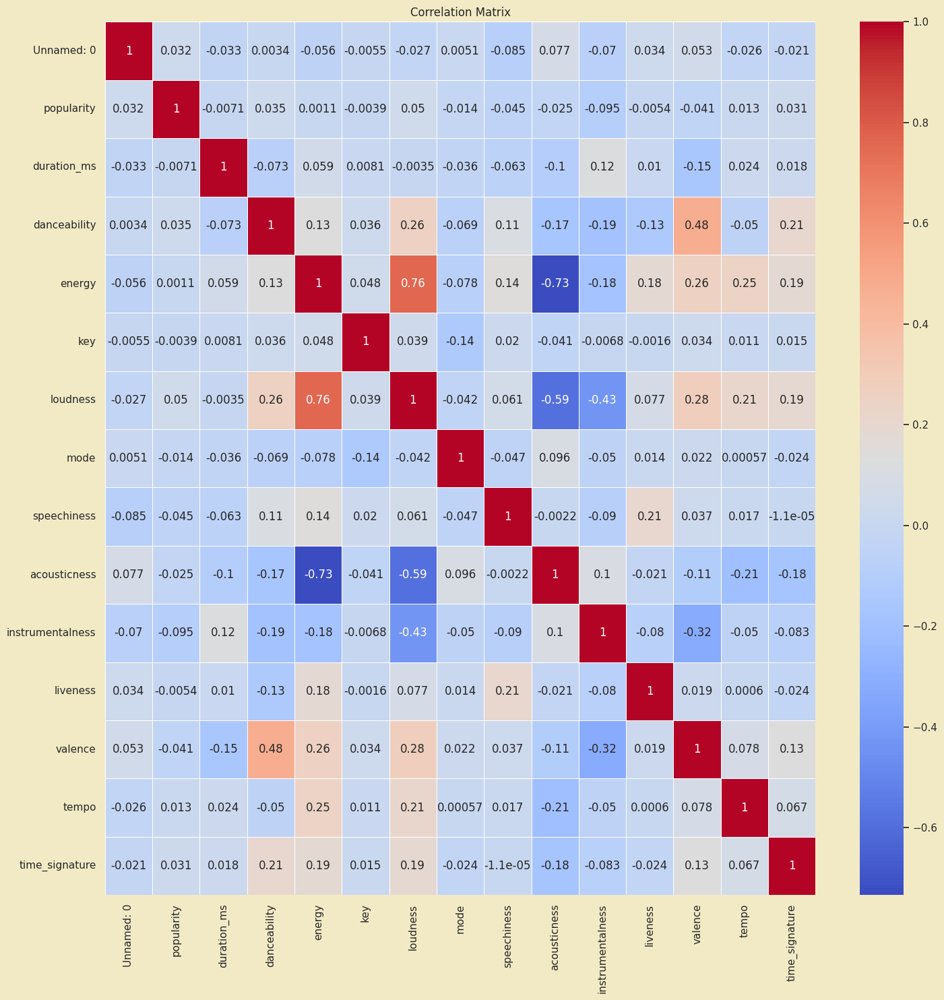

In [246]:
plt.figure(figsize=(15,15))
correlation_matrix = df_numerical.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix')
plt.tight_layout()
plt.show()
plt.savefig('correlation_matrix_numerical_vars_heatmap.png')
plt.close()

**Observations:**
<ol>
<li>Ignoring the Unnamed feature as it is just serial number column.</li>
<li>Dancebility has a weak positive correlation with loudness as dance tracks tend to be on the louder side. But this cannot be taken as  conclusive.</li>
<li>Dancebility has a positive correlation with valence. Songs that are danceable tend to have a more positive or happy feel.</li>
<li>Energy has a strong positive correlation with loudness. This tells us that the high-energy tracks tend to be louder.</li>
<li>Acousticness has a strong negative correlation with energy. This gives us an insight that the acoustic tracks tend to be calmer and softer.</li>
<li>Acousticness has a moderate negative correlation with loudness which means acoustic songs tend to be quieter</li>
<li>Songs with more instrumental elements tend to be less loud, possibly because they lack prominent vocals which can contribute to a song’s loudness.</li>
<li>Popularity does not show strong correlations with features like energy, danceability, or loudness, suggesting that a song's popularity is influenced by factors beyond its musical attributes.*</li>
<li>The mode does not significantly correlate with features like energy, valence, or danceability, indicating that whether a song is in a major or minor key does not strongly affect these characteristics.</li>
</ol>

### Preparing the dataset for data analysis.

In [247]:
df1 = df.copy()
df1.sample(5)

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
54126,54126,2fLFNk6oZD6vGQ3CvnA4NI,Ochre,A Midsummer Nice Dream,Low Grav Freefall (High Altitude Mix),15,272000,False,0.512,0.821,...,-12.631,1,0.0722,0.3670,0.716,0.126,0.150,159.875,4,idm
18485,18485,0x3TfyPKpkkFN6fl4ALxdN,Patton Oswalt,Finest Hour,The Gifted Child,24,102240,True,0.638,0.925,...,-5.189,1,0.9520,0.6830,0.000,0.893,0.491,90.991,4,comedy
20120,20120,3TcL0dyCMyr0kyTTc4NLgI,Selena Gomez & The Scene,When The Sun Goes Down,Who Says,77,195613,False,0.682,0.927,...,-2.915,1,0.0479,0.0843,0.000,0.149,0.744,101.019,4,dance
63648,63648,3eKcbrTzvzPQqyD0T0C6N9,İlhan İrem,Dünden Yarına,İşte Hayat (Sensiz de Yaşanıyor),35,224666,False,0.606,0.742,...,-11.092,0,0.0966,0.3930,0.000,0.317,0.791,131.587,4,j-rock
43808,43808,6lppAaNhgh9dqfhQDyKTvd,Topsy Crettz,Drifting away,Drifting away,38,170662,False,0.762,0.529,...,-7.973,0,0.0461,0.0282,0.545,0.076,0.564,116.013,4,groove


### Dropping Missing values

In [248]:
# Finding the missing values
df1.isnull().sum()

,0
Unnamed: 0,0
track_id,0
artists,1
album_name,1
track_name,1
popularity,0
duration_ms,0
explicit,0
danceability,0
energy,0


#### Finding the missing value rows

In [249]:
df1[df1.isnull().any(axis=1)]

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
65900,65900,1kR4gIb7nGxHPI3D2ifs59,NaN,NaN,NaN,0,0,False,0.501,0.583,...,-9.46,0,0.0605,0.69,0.00396,0.0747,0.734,138.391,4,k-pop


**There is only one single entry in the entire dataset which has a missing value. Also, in that entry, the missing values are duration, popularity, etc which make that entry virtually useless for data analysis. Hence it is better to drop the entry from the dataset.**

In [250]:
# dropping the entries with missing values
df1.dropna(inplace=True)
df1.shape

(113999, 21)

### Data Visualization and Exploratory Data Analysis

#### Note: Since this is a classification problem, it is important to understand the trends of each feature. Hence we will be visualizing the trends of average values for each important feature.

In [251]:
df1.head(1)

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.461,...,-6.746,0,0.143,0.0322,0.000001,0.358,0.715,87.917,4,acoustic


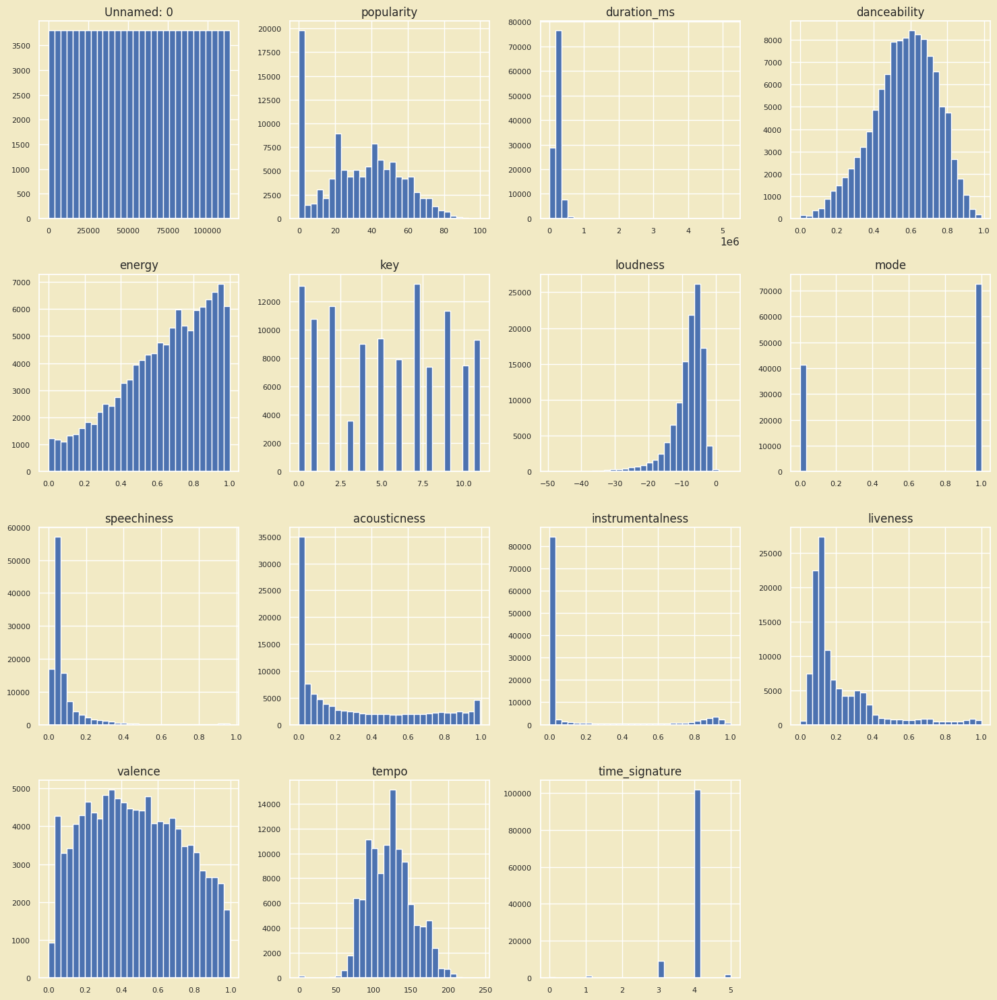

In [252]:
sns.set_style('darkgrid')
sns.set(rc={"axes.facecolor":"#F2EAC5","figure.facecolor":"#F2EAC5"})
df_numerical.hist(figsize=(15,15), bins=30, xlabelsize=8, ylabelsize=8)
plt.tight_layout()
plt.show()

In [253]:
# Creating a dataset consisting of average values
# Selecting only numerical features for calculating the mean
numerical_features = df1.select_dtypes(include=['int64', 'float64']).columns
average_df = df1.groupby('track_genre')[numerical_features].mean()

#### 1. Trends in popularity by genre

In [254]:
df1.popularity.value_counts(dropna=False)

,count
popularity,
0,16019
22,2354
21,2344
44,2288
1,2140
...,...
98,7
94,7
95,5


##### Barplot

Text(0, 0.5, 'Genre')

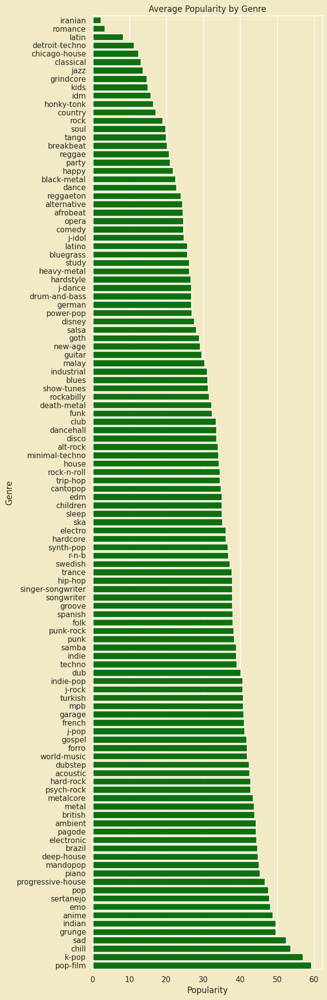

In [255]:
average_popularity_df = average_df.sort_values(by='popularity', ascending=True)

plt.figure(figsize=(6, 25))
sns.barplot(x='popularity', y=average_popularity_df.index, data=average_popularity_df, color='green')

# Title and axis
plt.title('Average Popularity by Genre')
plt.xlabel('Popularity')
plt.ylabel('Genre')

##### Box Plot

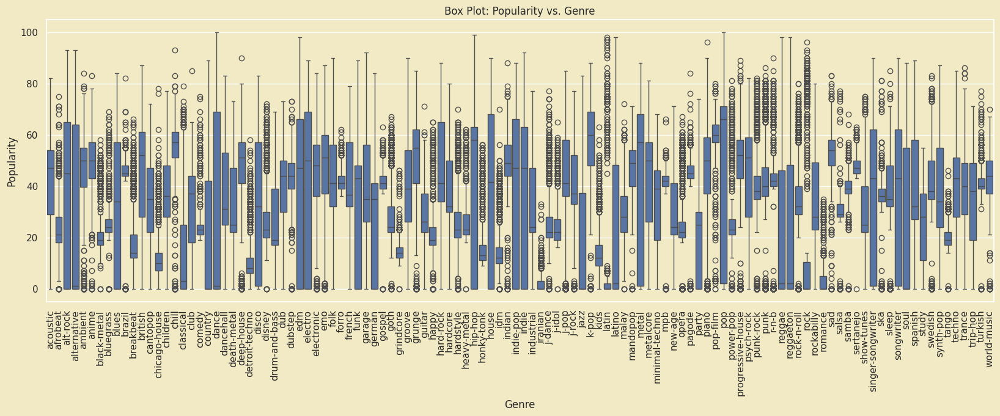

In [256]:
# Box plot for Popularity and Genre
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='popularity', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Popularity vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Popularity')
plt.show()

##### Dist Plot

<Figure size 1800x2000 with 0 Axes>

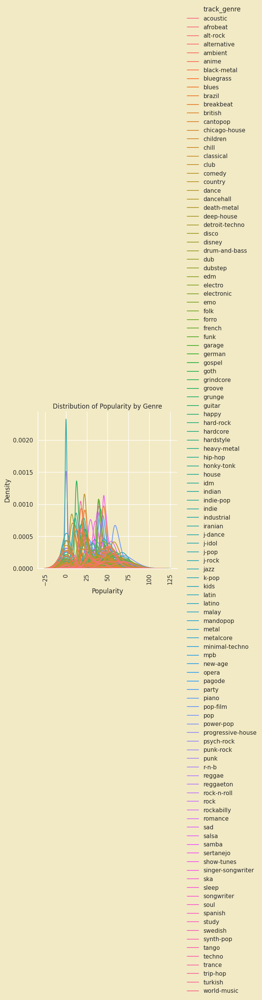

In [257]:
plt.figure(figsize=(18, 20))  # Adjust figure size if needed
sns.displot(data=df1, x='popularity', hue='track_genre', kind='kde')
plt.title('Distribution of Popularity by Genre')
plt.xlabel('Popularity')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

#### 2. Trends in duration by genre

In [258]:
df1['duration_ms'].value_counts(dropna=False)

,count
duration_ms,
162897,146
180000,104
192000,91
240000,84
118840,76
...,...
332604,1
422426,1
200516,1


##### Bar Plot

Text(0, 0.5, 'Genre')

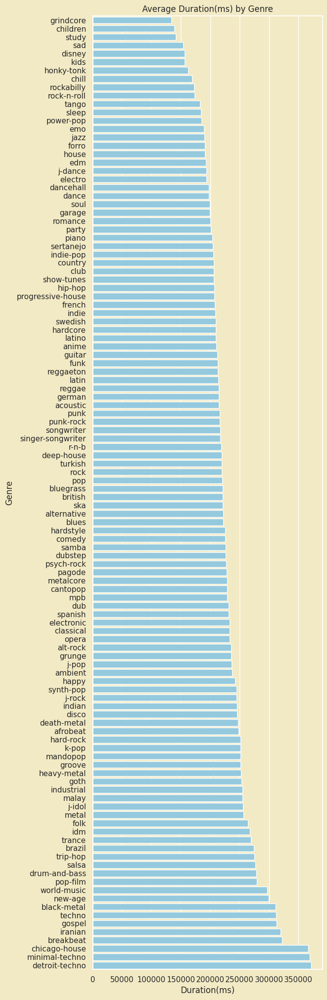

In [259]:
average_duration_df = average_df.sort_values(by='duration_ms', ascending=True)

plt.figure(figsize=(6, 25))
sns.barplot(x='duration_ms', y=average_duration_df.index, data=average_duration_df, color='skyblue')

# Title and axis
plt.title('Average Duration(ms) by Genre')
plt.xlabel('Duration(ms)')
plt.ylabel('Genre')


##### Box Plot

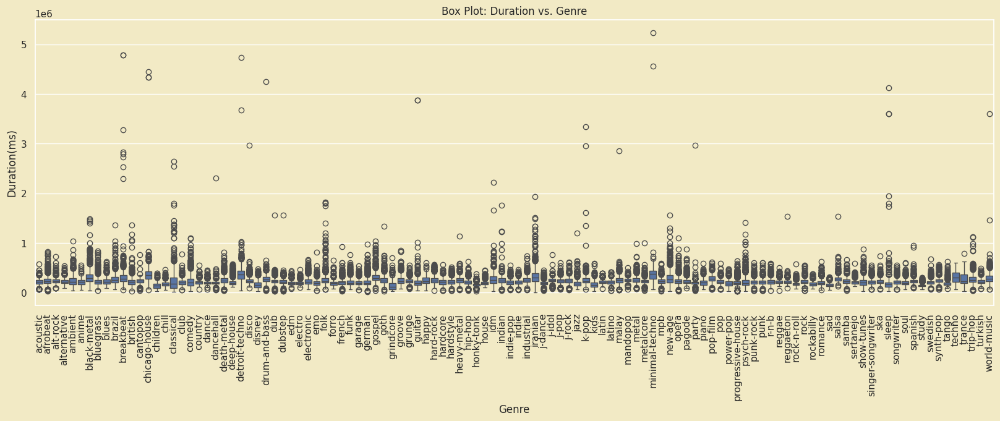

In [260]:
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='duration_ms', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Duration vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Duration(ms)')
plt.show()

##### Dist Plot

<Figure size 1800x2000 with 0 Axes>

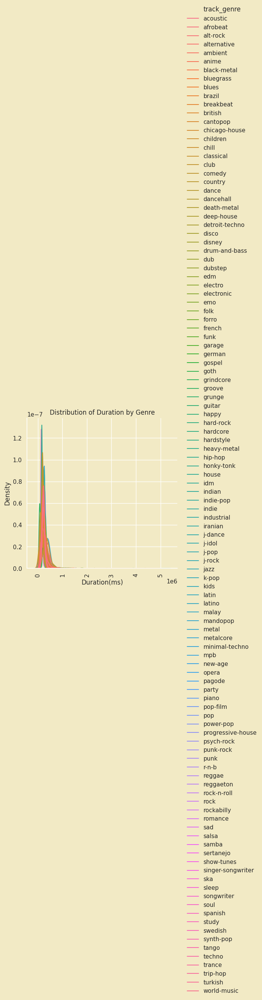

In [261]:
plt.figure(figsize=(18, 20))  # Adjust figure size if needed
sns.displot(data=df1, x='duration_ms', hue='track_genre', kind='kde')
plt.title('Distribution of Duration by Genre')
plt.xlabel('Duration(ms)')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

#### 3. Trends in dancebility by genre

In [262]:
df1['danceability'].value_counts(dropna=False)

,count
danceability,
0.6470,431
0.6090,357
0.5790,347
0.6850,335
0.6020,334
...,...
0.0906,1
0.0962,1
0.0802,1


#### Bar Plot

Text(0, 0.5, 'Genre')

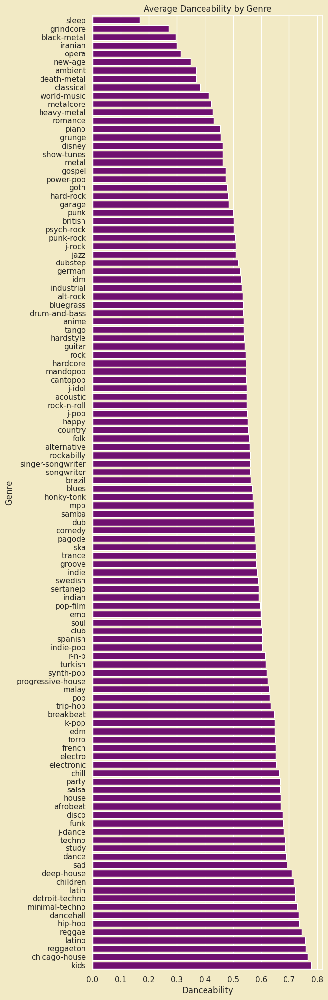

In [263]:
average_dancebility_df = average_df.sort_values(by='danceability', ascending=True)

plt.figure(figsize=(6, 25))
sns.barplot(x='danceability', y=average_dancebility_df.index, data=average_dancebility_df, color='purple')

# Title and axis
plt.title('Average Danceability by Genre')
plt.xlabel('Danceability')
plt.ylabel('Genre')


#### Box Plot

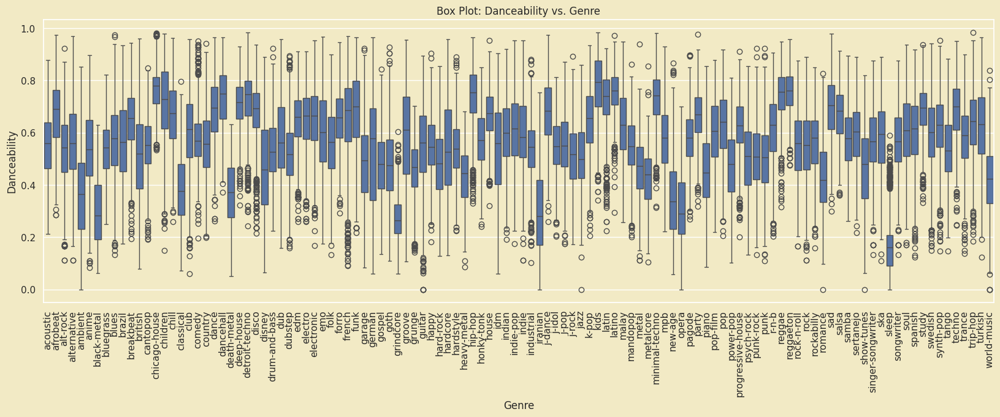

In [264]:
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='danceability', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Danceability vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Danceability')
plt.show()

##### Dist Plot

<Figure size 1800x2000 with 0 Axes>

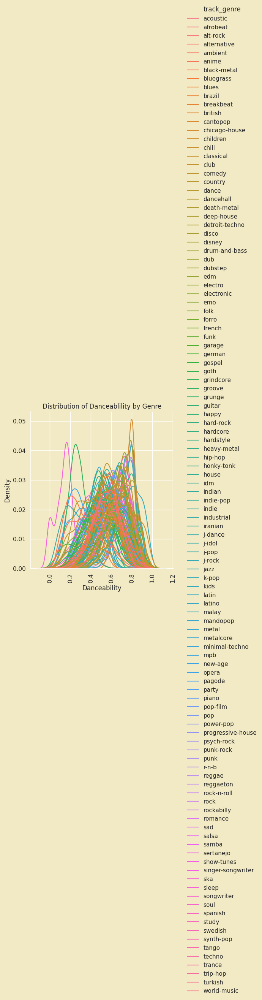

In [265]:
plt.figure(figsize=(18, 20))  # Adjust figure size if needed
sns.displot(data=df1, x='danceability', hue='track_genre', kind='kde')
plt.title('Distribution of Danceablility by Genre')
plt.xlabel('Danceability')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

#### 4. Trends in Energy by Genre

In [266]:
df1['energy'].value_counts(dropna=False)

,count
energy,
0.876000,318
0.937000,269
0.931000,261
0.801000,258
0.886000,258
...,...
0.000267,1
0.009400,1
0.000028,1


##### Bar Plot

Text(0, 0.5, 'Genre')

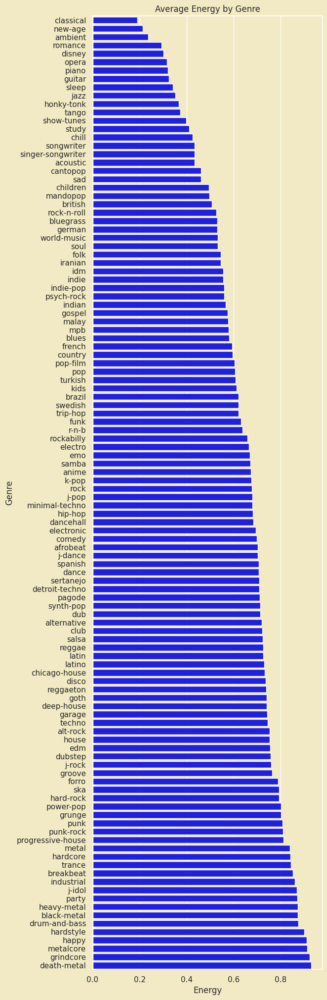

In [267]:
average_energy_df = average_df.sort_values(by='energy', ascending=True)

plt.figure(figsize=(6, 25))
sns.barplot(x='energy', y=average_energy_df.index, data=average_energy_df, color='blue')

# Title and axis
plt.title('Average Energy by Genre')
plt.xlabel('Energy')
plt.ylabel('Genre')

##### Box Plot

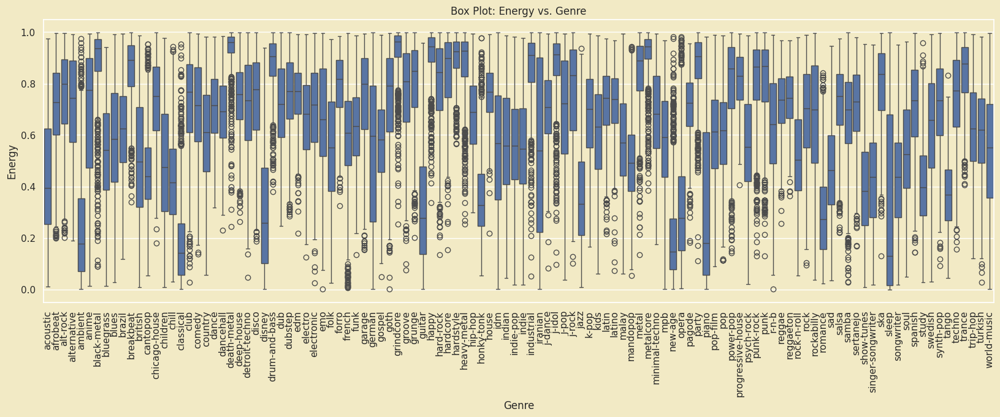

In [268]:
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='energy', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Energy vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Energy')
plt.show()

##### Dist Plot

<Figure size 1800x2000 with 0 Axes>

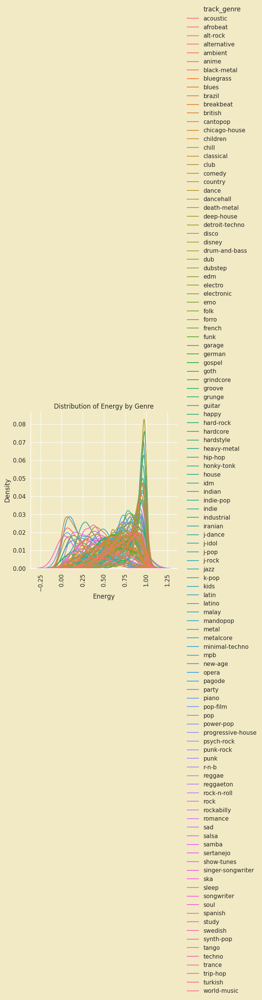

In [269]:
plt.figure(figsize=(18, 20))  # Adjust figure size if needed
sns.displot(data=df1, x='energy', hue='track_genre', kind='kde')
plt.title('Distribution of Energy by Genre')
plt.xlabel('Energy')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

#### 5. Trends in Loudness by Genre

In [270]:
df1['loudness'].value_counts(dropna=False)

,count
loudness,
-5.662,176
-4.457,90
-9.336,86
-7.570,77
-4.034,75
...,...
-14.878,1
-15.620,1
-15.680,1


##### Bar Plot

Text(0, 0.5, 'Genre')

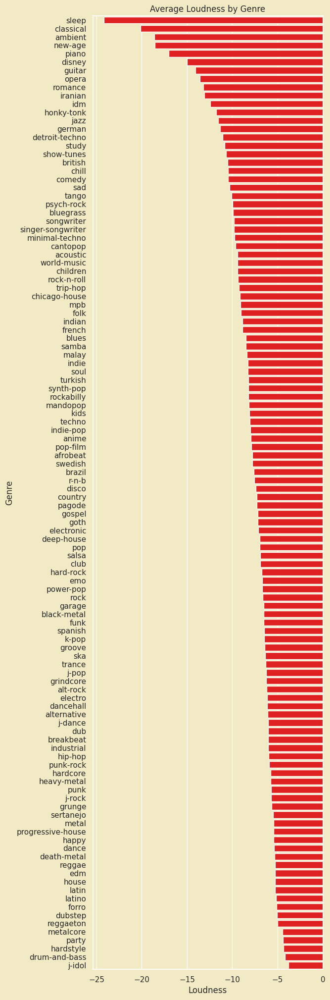

In [271]:
average_loudness_df = average_df.sort_values(by='loudness', ascending=True)

plt.figure(figsize=(6, 25))
sns.barplot(x='loudness', y=average_loudness_df.index, data=average_loudness_df, color='Red')

# Title and axis
plt.title('Average Loudness by Genre')
plt.xlabel('Loudness')
plt.ylabel('Genre')

##### Box Plot

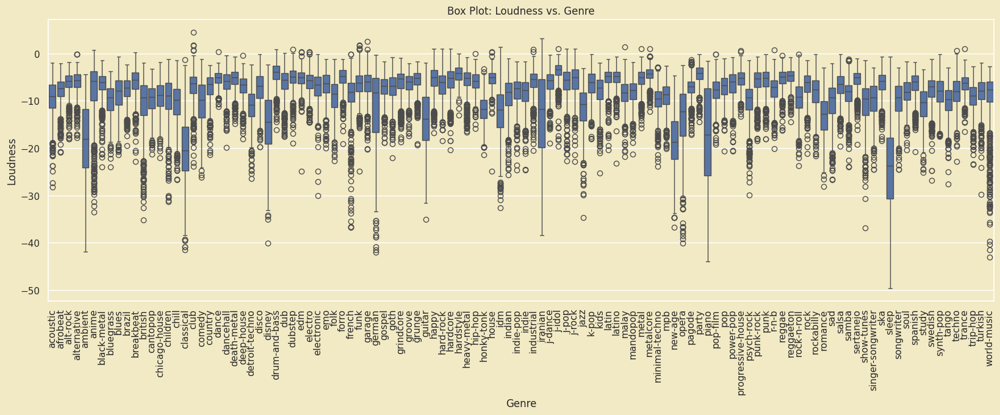

In [272]:
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='loudness', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Loudness vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Loudness')
plt.show()

##### Dist Plot

<Figure size 1800x2000 with 0 Axes>

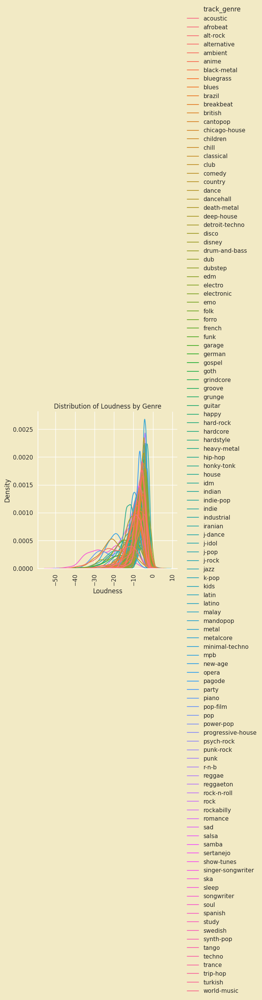

In [273]:
plt.figure(figsize=(18, 20))  # Adjust figure size if needed
sns.displot(data=df1, x='loudness', hue='track_genre', kind='kde')
plt.title('Distribution of Loudness by Genre')
plt.xlabel('Loudness')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

#### 6. Trends in Key by Genre

In [274]:
df1['key'].value_counts(dropna=False)

,count
key,
7,13244
0,13061
2,11644
9,11313
1,10772
5,9368
11,9282
4,9008
6,7921


##### Bar Plot

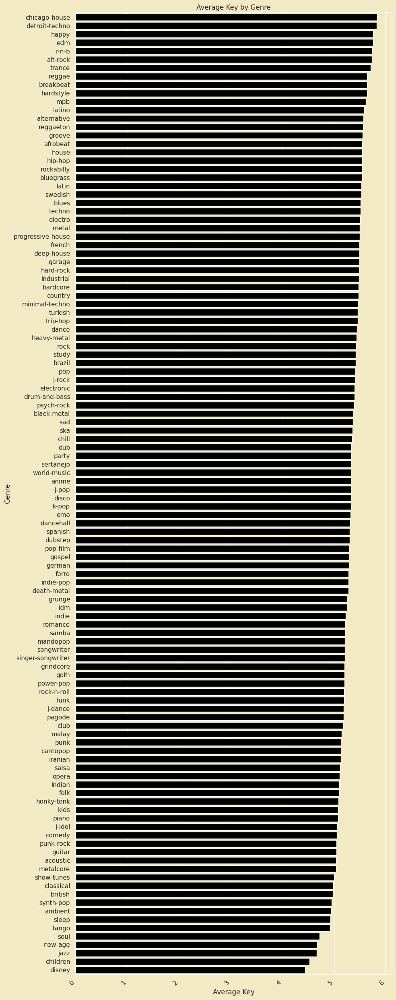

In [275]:
# Group data by genre and calculate the average key
average_key_by_genre = df1.groupby('track_genre')['key'].mean().reset_index()

average_key_by_genre = average_key_by_genre.sort_values(by='key', ascending=False)

# Create the bar plot
plt.figure(figsize=(10, 25))  # Adjust figsize for better readability
sns.barplot(x='key', y='track_genre', data=average_key_by_genre, color='black')

plt.title('Average Key by Genre')
plt.xlabel('Average Key')
plt.ylabel('Genre')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for readability

# Display the plot
plt.tight_layout()
plt.show()

##### Box Plot

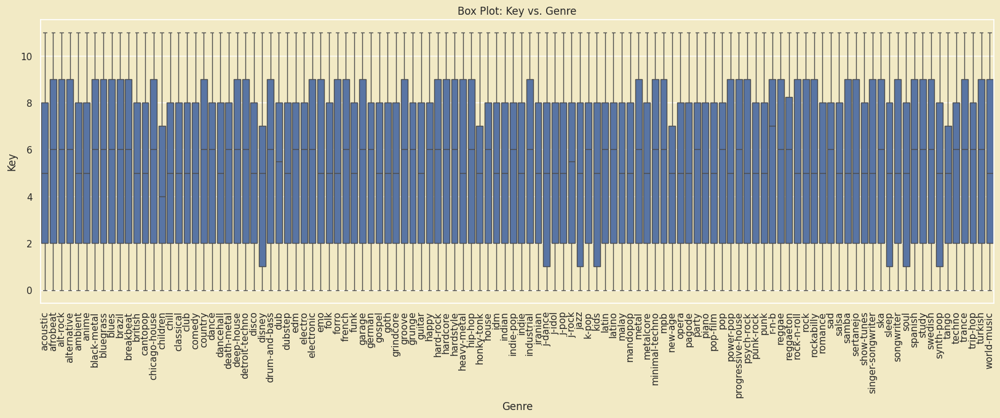

In [276]:
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='key', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Key vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Key')
plt.show()

##### Dist Plot

<Figure size 1800x2000 with 0 Axes>

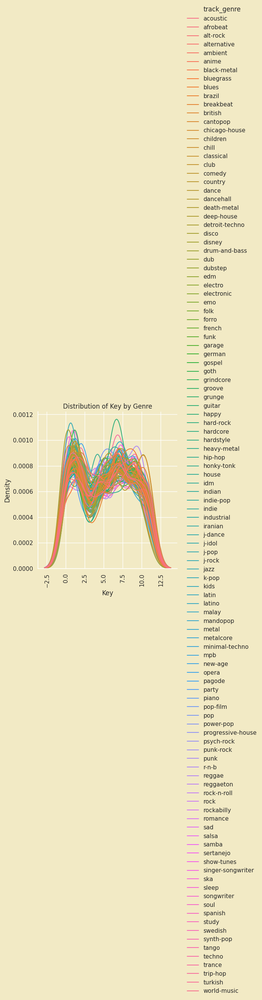

In [277]:
plt.figure(figsize=(18, 20))  # Adjust figure size if needed
sns.displot(data=df1, x='key', hue='track_genre', kind='kde')
plt.title('Distribution of Key by Genre')
plt.xlabel('Key')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

#### 7. Trends in Speechiness by Genre

In [278]:
df1['speechiness'].value_counts(dropna=False)

,count
speechiness,
0.0323,400
0.0324,376
0.0322,373
0.0328,363
0.0295,358
...,...
0.7080,1
0.6890,1
0.7030,1


##### Bar Plot

Text(0, 0.5, 'Genre')

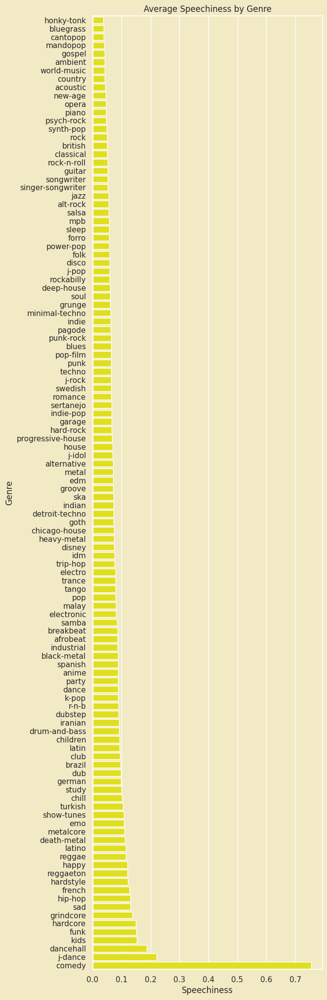

In [279]:
average_speechiness_df = average_df.sort_values(by='speechiness', ascending=True)

plt.figure(figsize=(6, 25))
sns.barplot(x='speechiness', y=average_speechiness_df.index, data=average_speechiness_df, color='yellow')

# Title and axis
plt.title('Average Speechiness by Genre')
plt.xlabel('Speechiness')
plt.ylabel('Genre')

##### Box Plot

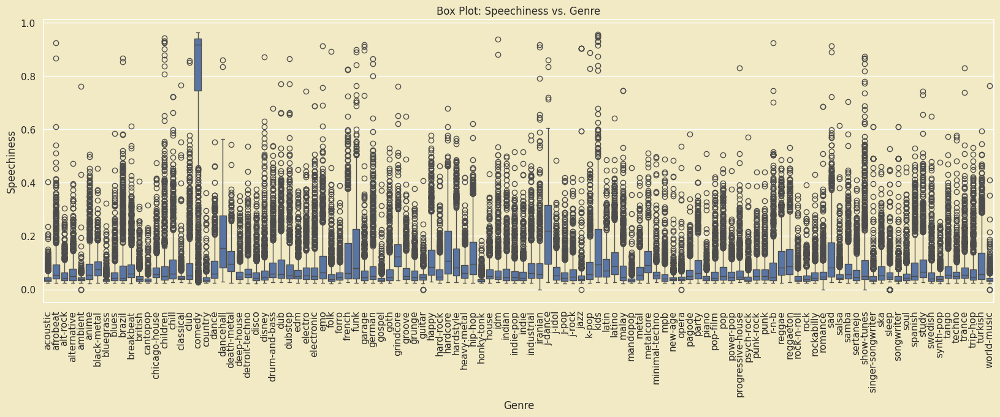

In [280]:
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='speechiness', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Speechiness vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Speechiness')
plt.show()

##### Dist Plot

<Figure size 1800x2000 with 0 Axes>

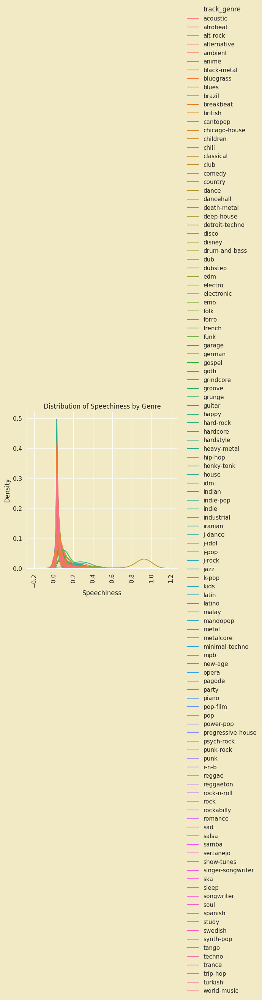

In [281]:
plt.figure(figsize=(18, 20))  # Adjust figure size if needed
sns.displot(data=df1, x='speechiness', hue='track_genre', kind='kde')
plt.title('Distribution of Speechiness by Genre')
plt.xlabel('Speechiness')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

#### 8. Trends in Acousticness by Genre

In [282]:
df1['acousticness'].value_counts(dropna=False)

,count
acousticness,
0.995000,305
0.993000,267
0.994000,266
0.992000,250
0.991000,218
...,...
0.000063,1
0.000021,1
0.000004,1


##### Bar Plot

Text(0, 0.5, 'Genre')

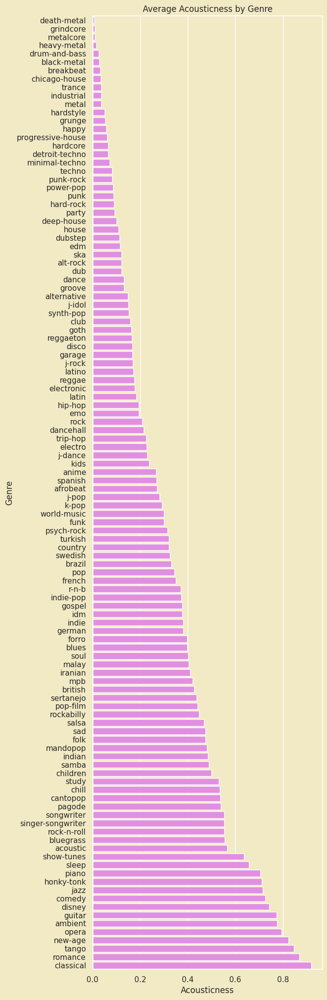

In [283]:
average_acousticness_df = average_df.sort_values(by='acousticness', ascending=True)

plt.figure(figsize=(6, 25))
sns.barplot(x='acousticness', y=average_acousticness_df.index, data=average_acousticness_df, color='violet')

# Title and axis
plt.title('Average Acousticness by Genre')
plt.xlabel('Acousticness')
plt.ylabel('Genre')

##### Box Plot

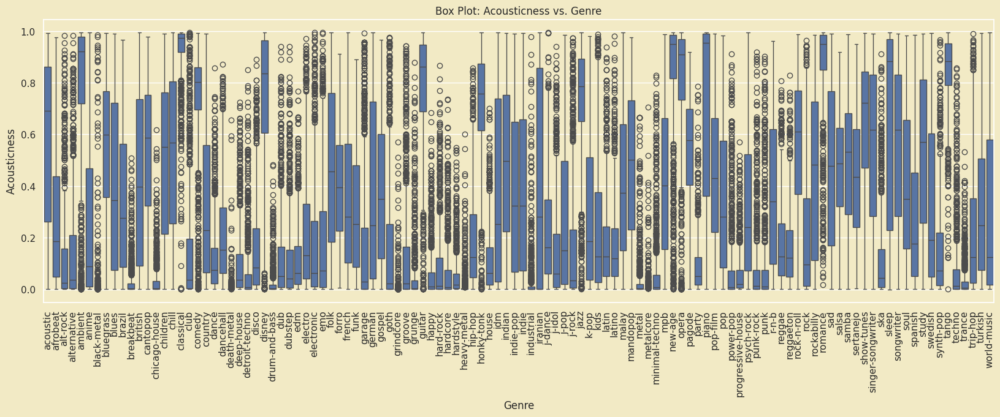

In [284]:
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='acousticness', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Acousticness vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Acousticness')
plt.show()

##### Dist Plot

<Figure size 1800x1600 with 0 Axes>

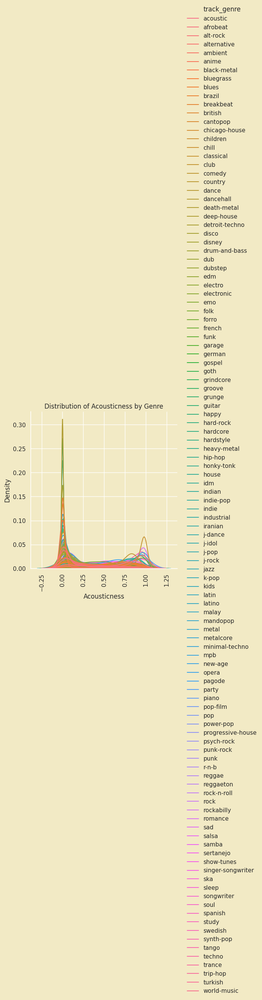

In [285]:
plt.figure(figsize=(18, 16))  # Adjust figure size if needed
sns.displot(data=df1, x='acousticness', hue='track_genre', kind='kde')
plt.title('Distribution of Acousticness by Genre')
plt.xlabel('Acousticness')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

#### 9. Trends in Instrumentalness by Genre

In [286]:
df1['instrumentalness'].value_counts(dropna=False)

,count
instrumentalness,
0.000000,38763
0.000036,166
0.905000,122
0.895000,122
0.934000,121
...,...
0.000065,1
0.000098,1
0.000071,1


##### Bar Plot

Text(0, 0.5, 'Genre')

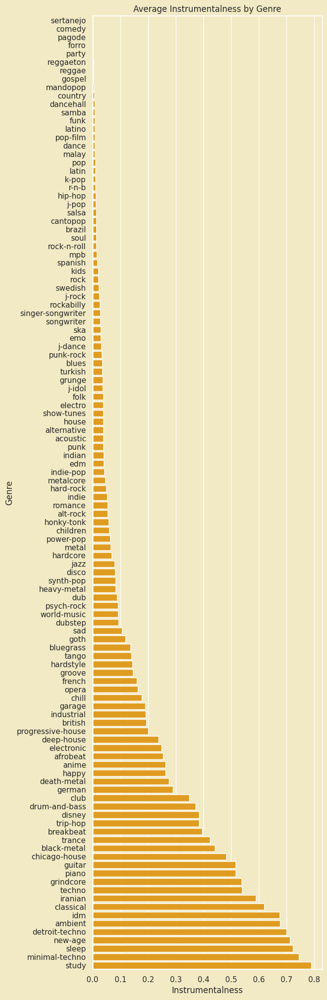

In [287]:
average_instrumentalness_df = average_df.sort_values(by='instrumentalness', ascending=True)

plt.figure(figsize=(6, 25))
sns.barplot(x='instrumentalness', y=average_instrumentalness_df.index, data=average_instrumentalness_df, color='Orange')

# Title and axis
plt.title('Average Instrumentalness by Genre')
plt.xlabel('Instrumentalness')
plt.ylabel('Genre')

##### Box Plot

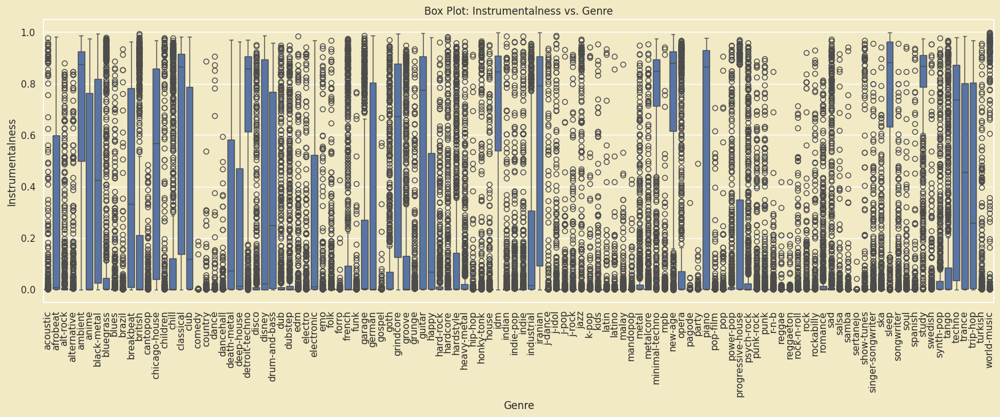

In [288]:
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='instrumentalness', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Instrumentalness vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Instrumentalness')
plt.show()

##### Dist Plot

<Figure size 1800x2000 with 0 Axes>

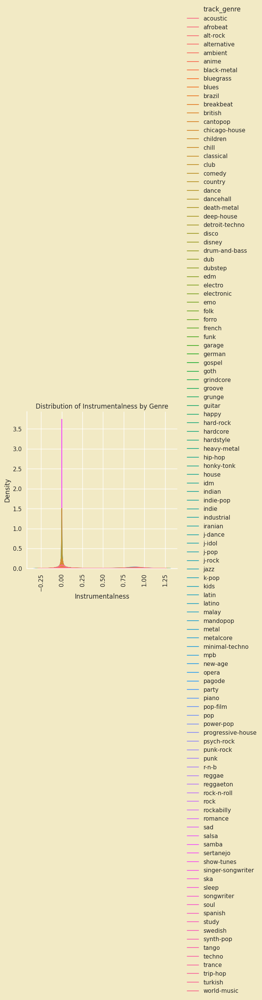

In [289]:
plt.figure(figsize=(18, 20))  # Adjust figure size if needed
sns.displot(data=df1, x='instrumentalness', hue='track_genre', kind='kde')
plt.title('Distribution of Instrumentalness by Genre')
plt.xlabel('Instrumentalness')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

#### 10. Trends in Liveness by Genre


In [290]:
df1['liveness'].value_counts(dropna=False)

,count
liveness,
0.1080,1353
0.1110,1318
0.1090,1198
0.1100,1179
0.1050,1114
...,...
0.0163,1
0.0220,1
0.0162,1


##### Bar Plot

Text(0, 0.5, 'Genre')

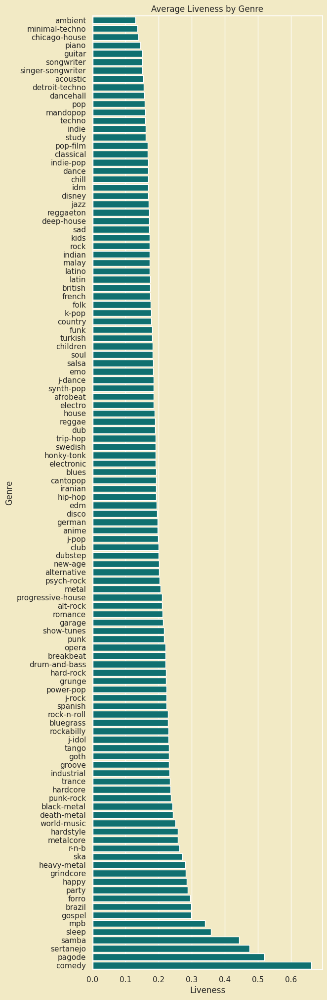

In [291]:
average_liveness_df = average_df.sort_values(by='liveness', ascending=True)

plt.figure(figsize=(6, 25))
sns.barplot(x='liveness', y=average_liveness_df.index, data=average_liveness_df, color='Teal')

# Title and axis
plt.title('Average Liveness by Genre')
plt.xlabel('Liveness')
plt.ylabel('Genre')

##### Box Plot

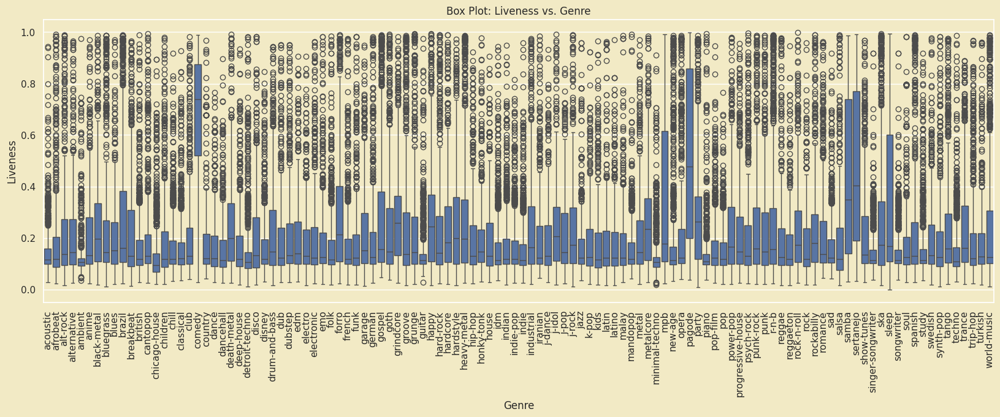

In [292]:
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='liveness', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Liveness vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Liveness')
plt.show()

##### Dist Plot

<Figure size 1800x2000 with 0 Axes>

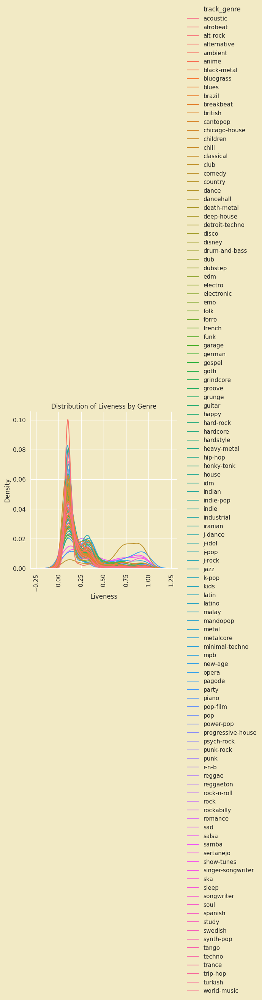

In [293]:
plt.figure(figsize=(18, 20))  # Adjust figure size if needed
sns.displot(data=df1, x='liveness', hue='track_genre', kind='kde')
plt.title('Distribution of Liveness by Genre')
plt.xlabel('Liveness')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

#### 11. Trends in Valence by Genre

In [294]:
df1['valence'].value_counts(dropna=False)

,count
valence,
0.96100,300
0.30400,248
0.71700,233
0.96200,230
0.32400,225
...,...
0.02190,1
0.01280,1
0.00271,1


##### Bar Plot

Text(0, 0.5, 'Genre')

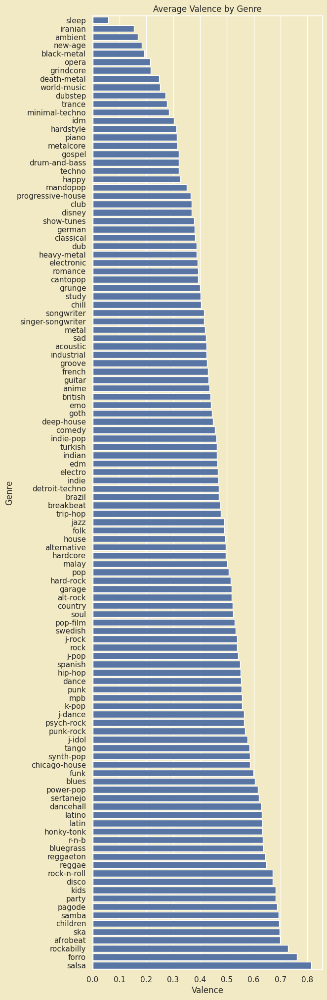

In [295]:
average_valence_df = average_df.sort_values(by='valence', ascending=True)

plt.figure(figsize=(6, 25))
sns.barplot(x='valence', y=average_valence_df.index, data=average_valence_df)

# Title and axis
plt.title('Average Valence by Genre')
plt.xlabel('Valence')
plt.ylabel('Genre')

#####Box Plot

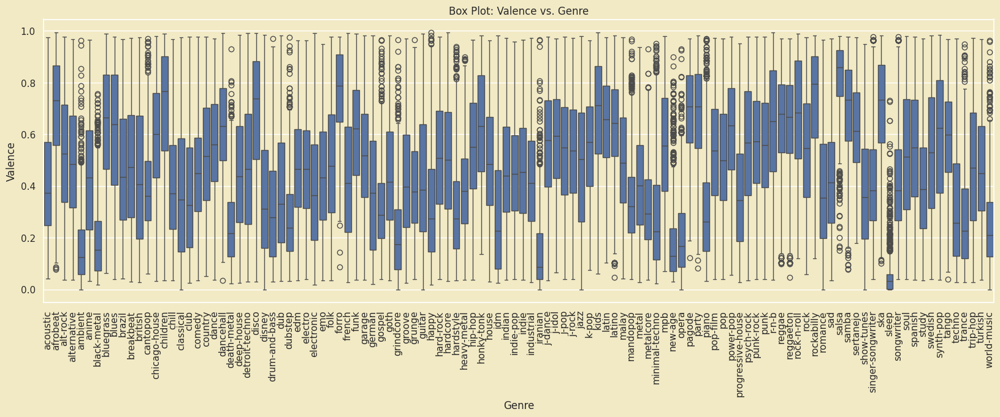

In [296]:
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='valence', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Valence vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Valence')
plt.show()

##### Dist Plot

<Figure size 1800x2000 with 0 Axes>

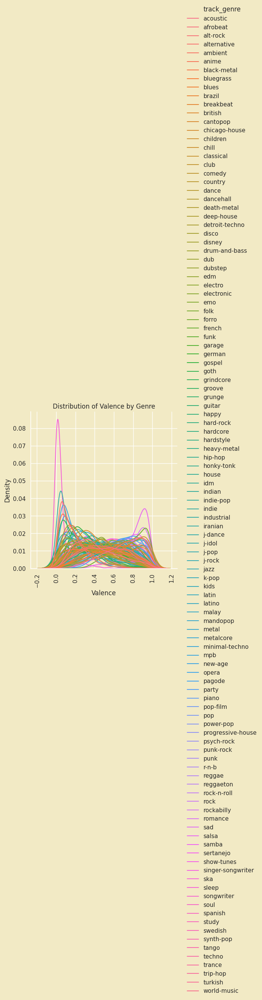

In [297]:
plt.figure(figsize=(18, 20))  # Adjust figure size if needed
sns.displot(data=df1, x='valence', hue='track_genre', kind='kde')
plt.title('Distribution of Valence by Genre')
plt.xlabel('Valence')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

#### 12. Trends in Tempo by Genre

In [298]:
df1['tempo'].value_counts(dropna=False)

,count
tempo,
0.000,157
151.925,146
95.004,95
87.925,76
130.594,76
...,...
178.076,1
78.793,1
151.861,1


##### Bar Plot

Text(0, 0.5, 'Genre')

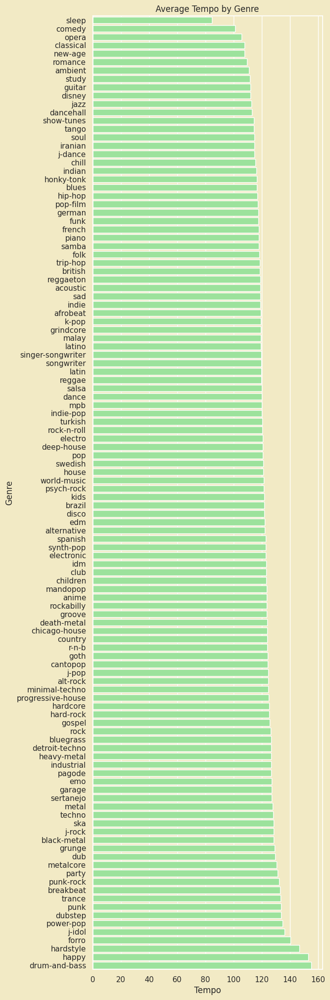

In [299]:
average_tempo_df = average_df.sort_values(by='tempo', ascending=True)

plt.figure(figsize=(6, 25))
sns.barplot(x='tempo', y=average_tempo_df.index, data=average_tempo_df, color='LightGreen')

# Title and axis
plt.title('Average Tempo by Genre')
plt.xlabel('Tempo')
plt.ylabel('Genre')

#### Box Plot

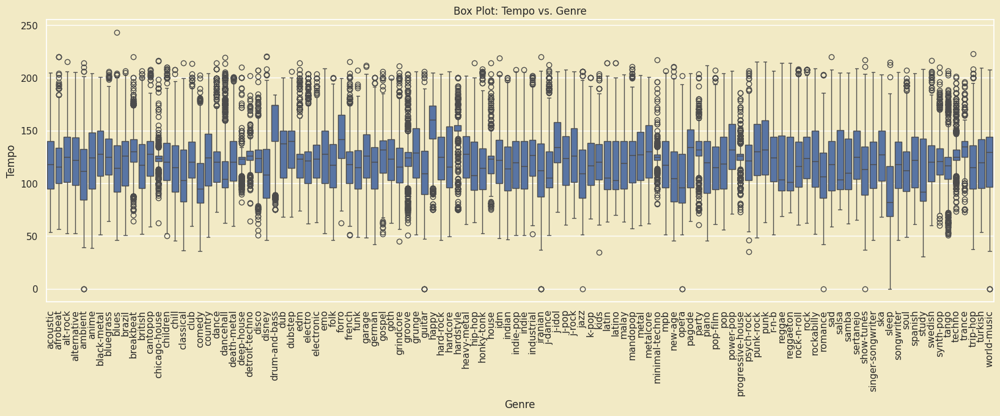

In [300]:
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='tempo', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Tempo vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Tempo')
plt.show()

##### Dist Plot

<Figure size 1800x2000 with 0 Axes>

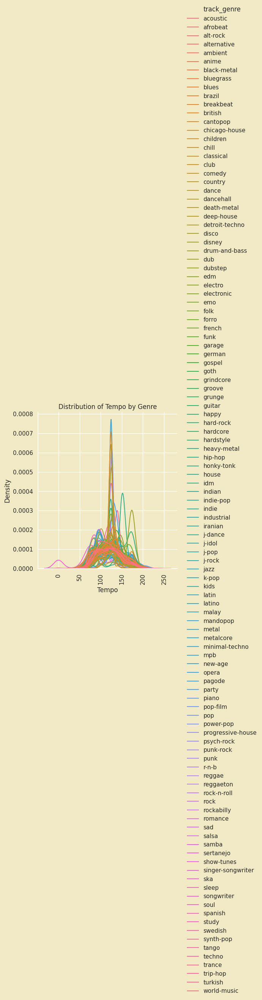

In [301]:
plt.figure(figsize=(18, 20))  # Adjust figure size if needed
sns.displot(data=df1, x='tempo', hue='track_genre', kind='kde')
plt.title('Distribution of Tempo by Genre')
plt.xlabel('Tempo')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

#### 13. Trends in Time Signature by Genre

In [302]:
df1['time_signature'].value_counts(dropna=False)

,count
time_signature,
4,101842
3,9195
5,1826
1,973
0,163


##### Bar Plot

Text(0, 0.5, 'Genre')

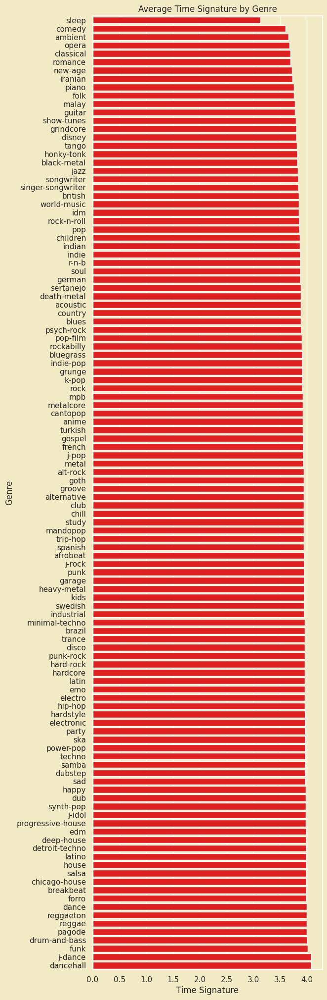

In [303]:
average_timeSignature_df = average_df.sort_values(by='time_signature', ascending=True)

plt.figure(figsize=(6, 25))
sns.barplot(x='time_signature', y=average_timeSignature_df.index, data=average_timeSignature_df, color='Red')

# Title and axis
plt.title('Average Time Signature by Genre')
plt.xlabel('Time Signature')
plt.ylabel('Genre')

##### Box Plot

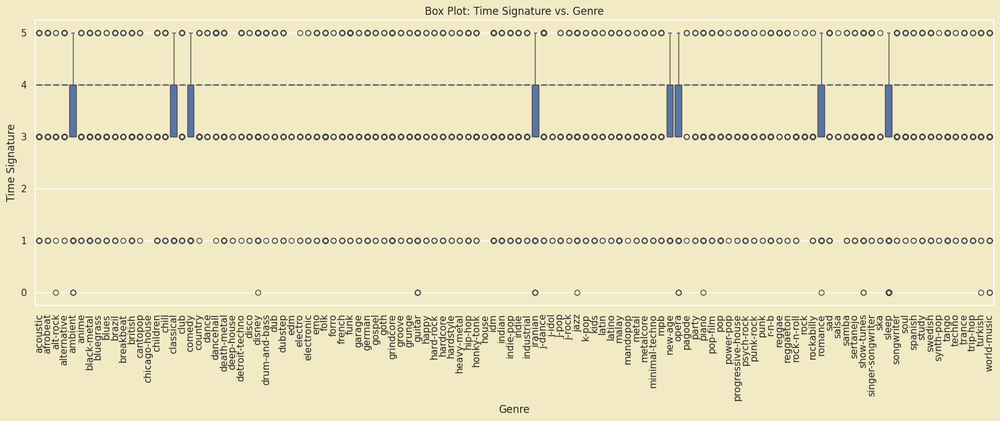

In [304]:
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='time_signature', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Time Signature vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Time Signature')
plt.show()

##### Dist Plot

<Figure size 1800x2000 with 0 Axes>

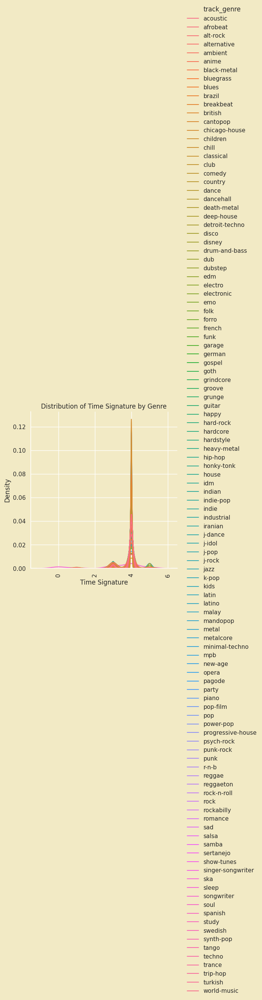

In [305]:
plt.figure(figsize=(18, 20))  # Adjust figure size if needed
sns.displot(data=df1, x='time_signature', hue='track_genre', kind='kde')
plt.title('Distribution of Time Signature by Genre')
plt.xlabel('Time Signature')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

#### 14. Trends in Mode by Genre

In [306]:
df1['mode'].value_counts(dropna=False)

,count
mode,
1,72681
0,41318


##### Bar Plot

Text(0, 0.5, 'Genre')

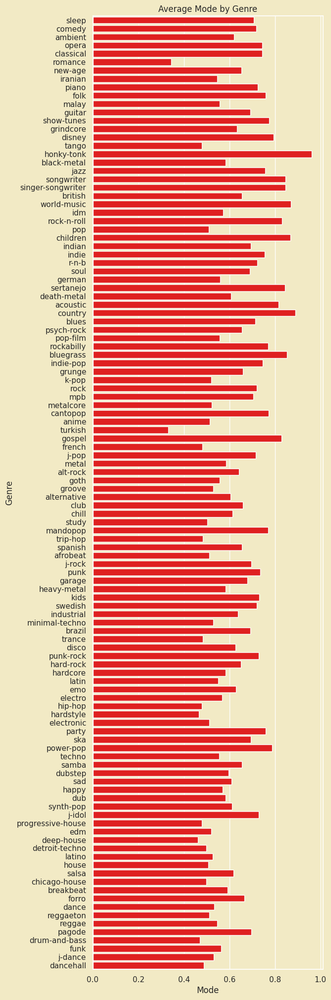

In [307]:
average_mode_df = average_df.sort_values(by='mode', ascending=True)

plt.figure(figsize=(6, 25))
sns.barplot(x='mode', y=average_timeSignature_df.index, data=average_timeSignature_df, color='Red')

# Title and axis
plt.title('Average Mode by Genre')
plt.xlabel('Mode')
plt.ylabel('Genre')

##### Box Plot

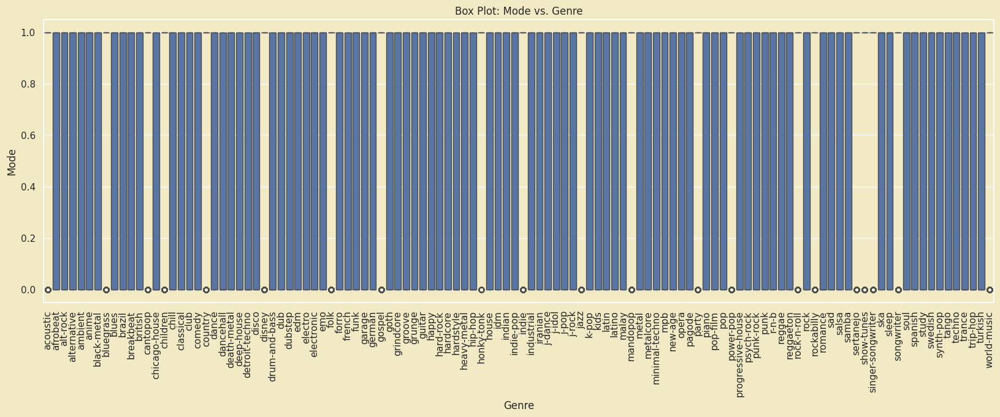

In [308]:
plt.figure(figsize=(20, 6))
sns.boxplot(x='track_genre', y='mode', data=df1)
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Box Plot: Mode vs. Genre')
plt.xlabel('Genre')
plt.ylabel('Mode')
plt.show()

##### Dist Plot

<Figure size 1800x2000 with 0 Axes>

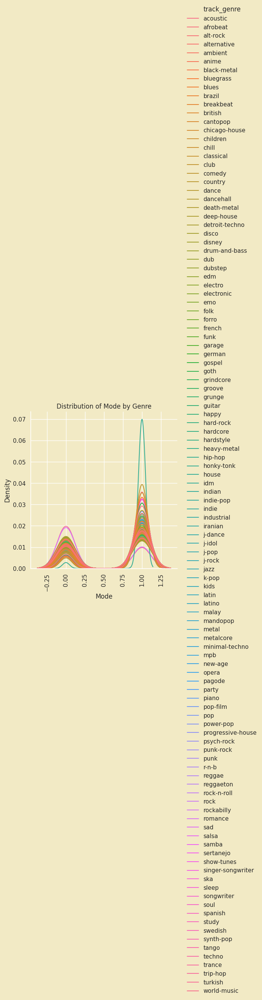

In [309]:
plt.figure(figsize=(18, 20))  # Adjust figure size if needed
sns.displot(data=df1, x='mode', hue='track_genre', kind='kde')
plt.title('Distribution of Mode by Genre')
plt.xlabel('Mode')
plt.ylabel('Density')
plt.xticks(rotation=90)
plt.show()

## Data Preparation

### Dropping Duplicates

In [310]:
df1.drop_duplicates(inplace=True)

### Dropping Non-Explanatory Features which will not be useful in the classification model

In [311]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

In [312]:
df1.drop(columns=['track_id', 'artists', 'album_name', 'track_name'], inplace=True)
df1.head(5)

,Unnamed: 0,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


**To focus on genre prediction based solely on sound characteristics, we will remove genres like ‘British’, ‘French’, or ‘German’ from the target variable. These classifications are based on origin or language, which aren’t captured by the audio features in the dataset. (Although, if we had lyrics information in our data, these would definitely be very easy to classify!)**

In [313]:
# Drop rows where the condition is True
non_sound_based_categories = ['british','french','german','swedish','spanish','indian','malay','turkish','world-music','gospel']
df = df.drop(df[df['track_genre'].isin(non_sound_based_categories)].index)

In [314]:
df1.drop(columns=df1.columns[0], inplace=True)
df1.sample(5)

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
96241,42,220306,False,0.651,0.874,0,-7.498,0,0.0461,0.25200,0.000000,0.837,0.960,168.266,4,samba
112084,48,180923,True,0.728,0.538,7,-11.973,1,0.1670,0.12900,0.000000,0.491,0.339,89.993,4,turkish
57547,0,254437,False,0.314,0.309,2,-3.809,1,0.0312,0.85500,0.000005,0.123,0.215,171.132,3,indie
33097,0,267493,False,0.532,0.842,2,-6.152,1,0.0403,0.00131,0.000001,0.330,0.715,126.042,4,emo
78803,24,188689,True,0.686,0.801,7,-6.871,1,0.1260,0.00537,0.000000,0.244,0.706,145.048,4,party


## Feature Transformation

In [315]:
# Converting the Explicit Feature using Binary Encoding
df1['explicit'] = np.where(df1['explicit'] == True, 1, 0)

df1.sample(3)

,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
98889,21,143267,0,0.483,0.854,0,-5.558,1,0.2340,0.290000,0.000011,0.0901,0.473,85.166,4,show-tunes
85873,34,175466,1,0.452,0.986,5,-3.223,1,0.0953,0.000022,0.000024,0.2440,0.418,104.822,4,punk-rock
77727,42,238720,0,0.580,0.580,2,-7.876,1,0.0342,0.737000,0.000000,0.6740,0.525,133.984,4,pagode


### Performing One-Hot Encoding on Key and Time Signature

In [316]:
df1 = pd.get_dummies(df1, columns=['key'], prefix = 'key', drop_first=True, dtype=int)
df1 = pd.get_dummies(df1, columns=['time_signature'], prefix = 'meter', drop_first=True, dtype=int)

df1.head(3)

,popularity,duration_ms,explicit,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,...,key_6,key_7,key_8,key_9,key_10,key_11,meter_1,meter_3,meter_4,meter_5
0,73,230666,0,0.676,0.461,-6.746,0,0.1430,0.0322,0.000001,...,0,0,0,0,0,0,0,0,1,0
1,55,149610,0,0.420,0.166,-17.235,1,0.0763,0.9240,0.000006,...,0,0,0,0,0,0,0,0,1,0
2,57,210826,0,0.438,0.359,-9.734,1,0.0557,0.2100,0.000000,...,0,0,0,0,0,0,0,0,1,0


In [317]:
df2 = df1.copy()
df2.head()

,popularity,duration_ms,explicit,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,...,key_6,key_7,key_8,key_9,key_10,key_11,meter_1,meter_3,meter_4,meter_5
0,73,230666,0,0.676,0.4610,-6.746,0,0.1430,0.0322,0.000001,...,0,0,0,0,0,0,0,0,1,0
1,55,149610,0,0.420,0.1660,-17.235,1,0.0763,0.9240,0.000006,...,0,0,0,0,0,0,0,0,1,0
2,57,210826,0,0.438,0.3590,-9.734,1,0.0557,0.2100,0.000000,...,0,0,0,0,0,0,0,0,1,0
3,71,201933,0,0.266,0.0596,-18.515,1,0.0363,0.9050,0.000071,...,0,0,0,0,0,0,0,1,0,0
4,82,198853,0,0.618,0.4430,-9.681,1,0.0526,0.4690,0.000000,...,0,0,0,0,0,0,0,0,1,0


## Feature Scaling

In [318]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

# Scaling function
def perform_scaling(df1, columns_to_scale, scaler_type):
    # scaler_type == 1 for StandardScaler, 2 for MinMaxScaler, 3 for RobustScaler
    if scaler_type == 1:
        scaler = StandardScaler()
    elif scaler_type == 2:
        scaler = MinMaxScaler()
    elif scaler_type == 3:
        scaler = RobustScaler()
    else:
        raise ValueError("Invalid scaler_type. Use 1 for StandardScaler, 2 for MinMaxScaler or 3 for Robust Scaler.")

    scaled_data = scaler.fit_transform(df[columns_to_scale])
    scaled_df = pd.DataFrame(scaled_data, columns=columns_to_scale)
    df_scaled = pd.concat([df.drop(columns=columns_to_scale).reset_index(drop=True), scaled_df], axis=1)

    return df_scaled

# Define numeric columns
numeric_cols = ["popularity","duration_ms","danceability","energy","loudness","speechiness","acousticness","instrumentalness","liveness","valence","tempo"]

# Perform Scaling
df = perform_scaling(df, numeric_cols, 1)


In [319]:
#count the number of unique vales
df2['track_genre'].unique()

array(['acoustic', 'afrobeat', 'alt-rock', 'alternative', 'ambient',
       'anime', 'black-metal', 'bluegrass', 'blues', 'brazil',
       'breakbeat', 'british', 'cantopop', 'chicago-house', 'children',
       'chill', 'classical', 'club', 'comedy', 'country', 'dance',
       'dancehall', 'death-metal', 'deep-house', 'detroit-techno',
       'disco', 'disney', 'drum-and-bass', 'dub', 'dubstep', 'edm',
       'electro', 'electronic', 'emo', 'folk', 'forro', 'french', 'funk',
       'garage', 'german', 'gospel', 'goth', 'grindcore', 'groove',
       'grunge', 'guitar', 'happy', 'hard-rock', 'hardcore', 'hardstyle',
       'heavy-metal', 'hip-hop', 'honky-tonk', 'house', 'idm', 'indian',
       'indie-pop', 'indie', 'industrial', 'iranian', 'j-dance', 'j-idol',
       'j-pop', 'j-rock', 'jazz', 'k-pop', 'kids', 'latin', 'latino',
       'malay', 'mandopop', 'metal', 'metalcore', 'minimal-techno', 'mpb',
       'new-age', 'opera', 'pagode', 'party', 'piano', 'pop-film', 'pop',
       'pow

### We will merge or prune the genres as a lot of genres result in a complex model and leads to poor performance.

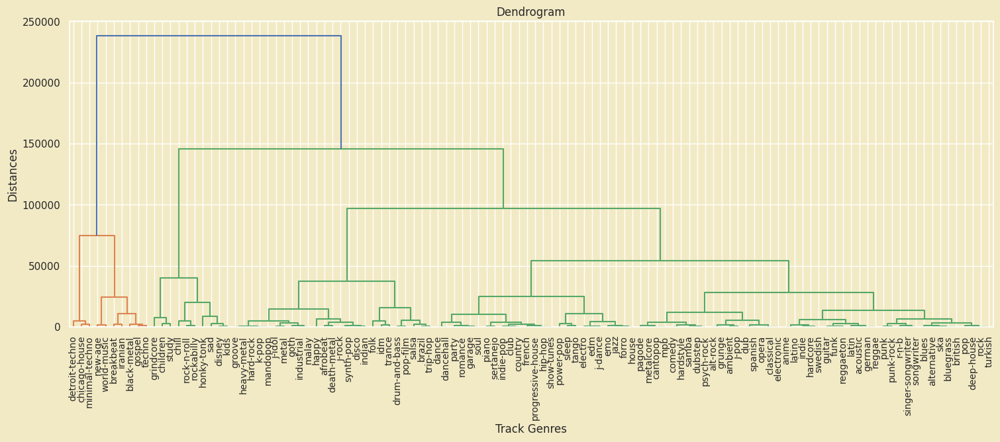

In [320]:
import scipy.cluster.hierarchy as sch
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


# Group by genre and select only numerical features for mean calculation
genres_average = df1.groupby('track_genre').mean()

# Perform hierarchical clustering
plt.figure(figsize=(18, 6))
dendrogram = sch.dendrogram(sch.linkage(genres_average, method='complete'), labels=genres_average.index)

# Show the dendrogram
plt.title('Dendrogram')
plt.xlabel('Track Genres')
plt.ylabel('Distances')

# Increase the size of x-labels
plt.tick_params(axis='x', labelsize=10)

# Show the plot
plt.show()

**If we choose a distance threshold of 1, we can reduce our genres by approximately half. By using scipy’s fcluster, we can obtain the final clusters in a dictionary-like format, which is very useful for our purpose.**

In [321]:
from scipy.cluster.hierarchy import fcluster

# Perform hierarchical clustering
linkage_matrix = sch.linkage(genres_average, method='complete')

# Specify the distance threshold
threshold = 1

# Extract the cluster labels based on the threshold
clusters = fcluster(linkage_matrix, threshold, criterion='distance')

# Add cluster labels to the original DataFrame
genres_average['Cluster'] = clusters

# Set the maximum number of rows to display
pd.set_option('display.max_rows', 60)

# Create a dictionary to store classes and clusters
cluster_dict = {}
for i, (cluster, category) in enumerate(zip(clusters, genres_average.index)):
    if cluster not in cluster_dict:
        cluster_dict[cluster] = []
    cluster_dict[cluster].append(category)

ordered_cluster_dict = dict(sorted(cluster_dict.items()))

# Display the dictionary sorted by cluster
ordered_cluster_dict

{np.int32(1): ['chicago-house'],
 np.int32(2): ['minimal-techno'],
 np.int32(3): ['detroit-techno'],
 np.int32(4): ['new-age'],
 np.int32(5): ['world-music'],
 np.int32(6): ['breakbeat'],
 np.int32(7): ['iranian'],
 np.int32(8): ['gospel'],
 np.int32(9): ['techno'],
 np.int32(10): ['black-metal'],
 np.int32(11): ['children'],
 np.int32(12): ['study'],
 np.int32(13): ['grindcore'],
 np.int32(14): ['rock-n-roll'],
 np.int32(15): ['rockabilly'],
 np.int32(16): ['chill'],
 np.int32(17): ['disney'],
 np.int32(18): ['kids'],
 np.int32(19): ['sad'],
 np.int32(20): ['honky-tonk'],
 np.int32(21): ['groove'],
 np.int32(22): ['heavy-metal'],
 np.int32(23): ['k-pop'],
 np.int32(24): ['mandopop'],
 np.int32(25): ['hard-rock'],
 np.int32(26): ['j-idol'],
 np.int32(27): ['metal'],
 np.int32(28): ['industrial'],
 np.int32(29): ['malay'],
 np.int32(30): ['goth'],
 np.int32(31): ['afrobeat'],
 np.int32(32): ['death-metal'],
 np.int32(33): ['j-rock'],
 np.int32(34): ['synth-pop'],
 np.int32(35): ['disco'

In [322]:
# Dictionary with descriptive names

consolidated_genres = {'agressive-fusion': ['dubstep', 'grunge', 'metal'],
                       'industrial': ['goth', 'heavy-metal', 'industrial'],
                       'punk-rock': ['alt-rock', 'garage', 'hard-rock', 'j-rock', 'punk', 'punk-rock'],
                       'hardstyle': ['happy', 'hardstyle'],
                       'disco-ska': ['disco', 'ska', 'synth-pop'],
                       'rock': ['alternative', 'rock'],
                       'anime': ['anime', 'club'],
                       'edm-house': ['deep-house', 'electronic', 'progressive-house'],
                       'edm': ['dub', 'edm', 'electro', 'groove', 'house'],
                       'j-dance': ['dancehall', 'j-dance'],
                       'funk-hip-hop': ['funk', 'hip-hop'],
                       'latin': ['dance', 'latin', 'latino', 'reggae', 'reggaeton'],
                       'pop': ['k-pop', 'pop', 'pop-film'],
                       'brazilian': ['brazil', 'mpb'],
                       'blues-rnb': ['blues', 'j-pop', 'r-n-b'],
                       'indie': ['folk', 'indie', 'indie-pop', 'psych-rock'],
                       'chill': ['chill', 'sad'],
                       'pagode-samba': ['pagode', 'samba', 'sertanejo'],
                       'country-soul': ['country', 'soul'],
                       'rock-n-roll': ['rock-n-roll', 'rockabilly'],
                       'chicago-house': ['chicago-house', 'detroit-techno'],
                       'jazz-tango': ['honky-tonk', 'jazz', 'tango'],
                       'vocal-pop': ['acoustic', 'cantopop', 'mandopop', 'singer-songwriter', 'songwriter'],
                       'disney': ['disney', 'guitar'],
                       'soundscape': ['ambient', 'new-age']}

# Create a dictionary to map old genres to new genres
genre_map = {old_genre: new_genre for new_genre, old_genres in consolidated_genres.items() for old_genre in old_genres}

# Replace the old genres with the new genres
df['track_genre'] = df['track_genre'].replace(genre_map)

In [323]:
df1.head()

,popularity,duration_ms,explicit,danceability,energy,loudness,mode,speechiness,acousticness,instrumentalness,...,key_6,key_7,key_8,key_9,key_10,key_11,meter_1,meter_3,meter_4,meter_5
0,73,230666,0,0.676,0.4610,-6.746,0,0.1430,0.0322,0.000001,...,0,0,0,0,0,0,0,0,1,0
1,55,149610,0,0.420,0.1660,-17.235,1,0.0763,0.9240,0.000006,...,0,0,0,0,0,0,0,0,1,0
2,57,210826,0,0.438,0.3590,-9.734,1,0.0557,0.2100,0.000000,...,0,0,0,0,0,0,0,0,1,0
3,71,201933,0,0.266,0.0596,-18.515,1,0.0363,0.9050,0.000071,...,0,0,0,0,0,0,0,1,0,0
4,82,198853,0,0.618,0.4430,-9.681,1,0.0526,0.4690,0.000000,...,0,0,0,0,0,0,0,0,1,0


In [324]:
df1.dtypes

,0
popularity,int64
duration_ms,int64
explicit,int64
danceability,float64
energy,float64
loudness,float64
mode,int64
speechiness,float64
acousticness,float64
instrumentalness,float64


In [325]:
from sklearn.preprocessing import LabelEncoder

# Define the target and explanatory features
X = df1.drop("track_genre", axis=1).values
y = df1["track_genre"].values

# Perform Label Encoding
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

# Store the genres encoded in the label encoder
genres = label_encoder.classes_

# Create a dictionary to map encoded labels to genre names
genre_mapping = {label: genre for label, genre in enumerate(genres)}

# Print the mapping (optional, for debugging)
print(genre_mapping)

{0: 'acoustic', 1: 'afrobeat', 2: 'alt-rock', 3: 'alternative', 4: 'ambient', 5: 'anime', 6: 'black-metal', 7: 'bluegrass', 8: 'blues', 9: 'brazil', 10: 'breakbeat', 11: 'british', 12: 'cantopop', 13: 'chicago-house', 14: 'children', 15: 'chill', 16: 'classical', 17: 'club', 18: 'comedy', 19: 'country', 20: 'dance', 21: 'dancehall', 22: 'death-metal', 23: 'deep-house', 24: 'detroit-techno', 25: 'disco', 26: 'disney', 27: 'drum-and-bass', 28: 'dub', 29: 'dubstep', 30: 'edm', 31: 'electro', 32: 'electronic', 33: 'emo', 34: 'folk', 35: 'forro', 36: 'french', 37: 'funk', 38: 'garage', 39: 'german', 40: 'gospel', 41: 'goth', 42: 'grindcore', 43: 'groove', 44: 'grunge', 45: 'guitar', 46: 'happy', 47: 'hard-rock', 48: 'hardcore', 49: 'hardstyle', 50: 'heavy-metal', 51: 'hip-hop', 52: 'honky-tonk', 53: 'house', 54: 'idm', 55: 'indian', 56: 'indie', 57: 'indie-pop', 58: 'industrial', 59: 'iranian', 60: 'j-dance', 61: 'j-idol', 62: 'j-pop', 63: 'j-rock', 64: 'jazz', 65: 'k-pop', 66: 'kids', 67: 

In [326]:
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Transform the train and test data into float
X_train = X_train.astype(np.float32)
X_test = X_test.astype(np.float32)

###Model Building and Evaluation

In [327]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix

def evaluate_model(model, name, X_test, y_test):
    """
    Evaluates a classification model and prints the results.

    Args:
        model: The trained classification model.
        name: The name of the model (for printing).
        X_test: The test data features.
        y_test: The test data target variable.
    """

    y_pred = model.predict(X_test)

    print(f"\n{name}")
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
    print(f"Precision: {precision_score(y_test, y_pred, average='weighted'):.4f}")
    print(f"Recall: {recall_score(y_test, y_pred, average='weighted'):.4f}")
    print(f"F1 Score: {f1_score(y_test, y_pred, average='weighted'):.4f}")

    # Optionally print the classification report and confusion matrix
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))  # , target_names=genres if you have the genres list

    print("\nConfusion Matrix:")
    print(confusion_matrix(y_test, y_pred))

### 1. K-NN Classifier

In [328]:
from sklearn.neighbors import KNeighborsClassifier

# Create the KNN classifier
knn_model = KNeighborsClassifier(n_neighbors = 10)

# Train the KNN classifier
knn_model.fit(X_train, y_train)

# Evaluate the KNN model
evaluate_model(knn_model, "K-Nearest Neighbors", X_test, y_test)


K-Nearest Neighbors
Accuracy: 0.0584
Precision: 0.0674
Recall: 0.0584
F1 Score: 0.0584

Classification Report:
              precision    recall  f1-score   support

           0       0.03      0.12      0.04       213
           1       0.02      0.10      0.04       203
           2       0.02      0.06      0.03       215
           3       0.06      0.12      0.08       184
           4       0.03      0.11      0.05       197
           5       0.01      0.04      0.02       193
           6       0.02      0.06      0.03       210
           7       0.02      0.05      0.03       205
           8       0.05      0.11      0.07       214
           9       0.01      0.03      0.02       197
          10       0.03      0.05      0.03       199
          11       0.01      0.02      0.02       214
          12       0.02      0.04      0.02       193
          13       0.07      0.13      0.09       206
          14       0.06      0.10      0.08       214
          15       0.01

### 2. Logistic Regression Classifier

In [329]:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train, y_train)
evaluate_model(model, "Logistic Regression", X_test, y_test)


Logistic Regression
Accuracy: 0.0437
Precision: 0.0300
Recall: 0.0437
F1 Score: 0.0215

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       213
           1       0.00      0.00      0.00       203
           2       0.00      0.00      0.00       215
           3       0.00      0.00      0.00       184
           4       0.07      0.05      0.05       197
           5       0.00      0.01      0.00       193
           6       0.00      0.00      0.00       210
           7       0.50      0.00      0.01       205
           8       0.00      0.00      0.00       214
           9       0.00      0.00      0.00       197
          10       0.03      0.02      0.02       199
          11       0.00      0.00      0.00       214
          12       0.00      0.00      0.00       193
          13       0.00      0.00      0.00       206
          14       0.06      0.19      0.09       214
          15       0.04

### 3. Decision Tree Classifier

In [330]:
from sklearn.tree import DecisionTreeClassifier

# Create and train the Decision Tree Classifier
decision_tree_model = DecisionTreeClassifier(random_state=42)  # You can adjust hyperparameters here
decision_tree_model.fit(X_train, y_train)

evaluate_model(decision_tree_model, "Decision Tree Classifier", X_test, y_test)


Decision Tree Classifier
Accuracy: 0.2167
Precision: 0.2240
Recall: 0.2167
F1 Score: 0.2189

Classification Report:
              precision    recall  f1-score   support

           0       0.10      0.09      0.10       213
           1       0.19      0.19      0.19       203
           2       0.02      0.03      0.02       215
           3       0.07      0.11      0.09       184
           4       0.19      0.21      0.20       197
           5       0.07      0.09      0.08       193
           6       0.45      0.48      0.47       210
           7       0.33      0.27      0.30       205
           8       0.10      0.14      0.12       214
           9       0.05      0.09      0.07       197
          10       0.33      0.32      0.32       199
          11       0.06      0.07      0.06       214
          12       0.18      0.19      0.19       193
          13       0.35      0.35      0.35       206
          14       0.30      0.24      0.27       214
          15      

### 4. SVM Classifier

### 5. Random Forest Classifier

In [331]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

evaluate_model(rf_model, "Random Forest Classifier", X_test, y_test)


Random Forest Classifier
Accuracy: 0.3299
Precision: 0.3196
Recall: 0.3299
F1 Score: 0.3207

Classification Report:
              precision    recall  f1-score   support

           0       0.20      0.19      0.19       213
           1       0.39      0.34      0.36       203
           2       0.03      0.03      0.03       215
           3       0.08      0.09      0.09       184
           4       0.38      0.35      0.36       197
           5       0.19      0.16      0.18       193
           6       0.57      0.65      0.61       210
           7       0.40      0.60      0.48       205
           8       0.17      0.14      0.16       214
           9       0.07      0.06      0.06       197
          10       0.54      0.50      0.52       199
          11       0.15      0.07      0.10       214
          12       0.33      0.34      0.33       193
          13       0.60      0.63      0.61       206
          14       0.54      0.49      0.51       214
          15      

### 6. Naive Bayes

In [332]:
from sklearn.naive_bayes import GaussianNB

nb_model = GaussianNB()
nb_model.fit(X_train, y_train)

evaluate_model(nb_model, "Naive Bayes", X_test, y_test)


Naive Bayes
Accuracy: 0.1170
Precision: 0.0816
Recall: 0.1170
F1 Score: 0.0708

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       213
           1       0.06      0.01      0.02       203
           2       0.00      0.00      0.00       215
           3       0.00      0.00      0.00       184
           4       0.15      0.07      0.09       197
           5       0.00      0.00      0.00       193
           6       0.14      0.10      0.11       210
           7       0.09      0.09      0.09       205
           8       0.00      0.00      0.00       214
           9       0.00      0.00      0.00       197
          10       0.04      0.01      0.02       199
          11       0.00      0.00      0.00       214
          12       0.02      0.01      0.01       193
          13       0.22      0.14      0.17       206
          14       0.24      0.08      0.12       214
          15       0.06      0.

### 7. Gradient Boost Classification

In [333]:
# from sklearn.ensemble import GradientBoostingClassifier

# gb_model = GradientBoostingClassifier(objective='multi:softmax', num_class=num_classes, seed=42)

# # Model Training
# gb_model.fit(X_train, y_train)


# # Model Evaluation
# evaluate_model(gb_model, "Gradient Boost Classifier", X_test, y_test)

### 8. Extreme Gradient Boost(XGBoost Classification)

In [334]:
# from xgboost import XGBClassifier

# xgb_model = XGBClassifier()

# # Model Training
# xgb_model.fit(X_train, y_train)

# # Model Evaluation
# evaluate_model(xgb_model, "XGBoost Classifier", X_test, y_test)

### Neural Network

In [335]:
import tensorflow as tf
from tensorflow import keras

# Define the number of classes and input features
num_classes = len(label_encoder.classes_)
inputs = keras.Input(shape=(X_train.shape[1],))

# Build the layers
nn_model = keras.Sequential([
    inputs,
    keras.layers.Dense(256, activation='relu'),
    keras.layers.Dense(128, activation='relu'),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(32, activation='relu'),
    keras.layers.Dense(num_classes, activation='softmax')])

# Define the accuracy metric
k=3
sparse_topK_categorical_accuracy = keras.metrics.SparseTopKCategoricalAccuracy(k = k)

# Compile the model
nn_model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.0001), loss='sparse_categorical_crossentropy', metrics=[sparse_topK_categorical_accuracy])

# Train the model
nn_model.fit(X_train, y_train, epochs=60, batch_size=128, validation_data=(X_test, y_test))

# Make predictions
y_pred_nn = nn_model.predict(X_test)

# Convert predictions to class labels
y_pred_classes = tf.argmax(y_pred_nn, axis=1).numpy()


Epoch 1/60
713/713 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - loss: 727.0457 - sparse_top_k_categorical_accuracy: 0.1613 - val_loss: 4.7362 - val_sparse_top_k_categorical_accuracy: 0.0241
Epoch 2/60
713/713 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - loss: 4.7362 - sparse_top_k_categorical_accuracy: 0.0269 - val_loss: 4.7363 - val_sparse_top_k_categorical_accuracy: 0.0234
Epoch 3/60
713/713 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 4.7362 - sparse_top_k_categorical_accuracy: 0.0267 - val_loss: 4.7363 - val_sparse_top_k_categorical_accuracy: 0.0235
Epoch 4/60
713/713 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - loss: 4.7362 - sparse_top_k_categorical_accuracy: 0.0266 - val_loss: 4.7364 - val_sparse_top_k_categorical_accuracy: 0.0234
Epoch 5/60
713/713 ━━━━━━━━━━━━━━━━━━━━ 5s 7ms/step - loss: 4.7362 - sparse_top_k_categorical_accuracy: 0.0261 - val_loss: 4.7364 - val_sparse_top_k_categorical_accuracy: 0.0233
Epoch 6/60
713/713 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - loss: 4.7362 - sparse_top_k_categorical_accuracy: 0.02

In [336]:
def evaluate_model(model, name, X_test, y_test):
    """
    Evaluates a classification model and prints the results.

    Args:
        model: The trained classification model.
        name: The name of the model (for printing).
        X_test: The test data features.
        y_test: The test data target variable.
    """

    y_pred = model.predict(X_test)

    # Convert probabilities to class labels (if needed)
    if isinstance(model, (keras.Sequential, keras.Model)):  # Check if it's a Keras model
        y_pred = tf.argmax(y_pred, axis=1).numpy()  # Convert probabilities to class labels

    print(f"\n{name}")
    print(f"Accuracy: {accuracy_score(y_test, y_pred):.4f}")
    print(f"Precision: {precision_score(y_test, y_pred, average='weighted'):.4f}")
    print(f"Recall: {recall_score(y_test, y_pred, average='weighted'):.4f}")
    print(f"F1 Score: {f1_score(y_test, y_pred, average='weighted'):.4f}")

    # Optionally print the classification report and confusion matrix
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))  # , target_names=genres if you have the genres list

    print("\nConfusion Matrix:")
    print(confusion_matrix(y_test, y_pred))


evaluate_model(nn_model, "Neural Network", X_test, y_test)

713/713 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step

Neural Network
Accuracy: 0.0073
Precision: 0.0001
Recall: 0.0073
F1 Score: 0.0001

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       213
           1       0.00      0.00      0.00       203
           2       0.00      0.00      0.00       215
           3       0.00      0.00      0.00       184
           4       0.00      0.00      0.00       197
           5       0.00      0.00      0.00       193
           6       0.00      0.00      0.00       210
           7       0.00      0.00      0.00       205
           8       0.00      0.00      0.00       214
           9       0.00      0.00      0.00       197
          10       0.00      0.00      0.00       199
          11       0.00      0.00      0.00       214
          12       0.00      0.00      0.00       193
          13       0.00      0.00      0.00       206
          14       0.00      0.00      0.

In [337]:
def top_k_accuracy(y_test, y_pred, k):
    # Calculate top-k categorical accuracy
    top_k_accuracy = tf.keras.metrics.sparse_top_k_categorical_accuracy(y_test, y_pred, k=k)
    top_k_accuracy = round(np.mean(top_k_accuracy)*100,2)

    # Calculate accuracy
    accuracy = tf.keras.metrics.sparse_top_k_categorical_accuracy(y_test, y_pred, k=1)
    accuracy = round(np.mean(accuracy)*100,2)

    print(f"Top-{k} categorical accuracy: {top_k_accuracy}%")
    print(f"Accuracy: {accuracy}%")

print("Neural Network Results:")
top_k_accuracy(y_test, y_pred_nn, k)
# print("XGBoost Results:")
# top_k_accuracy(y_test, y_pred_xgb, k)
# print("KNN Results:")
# top_k_accuracy(y_test, y_pred_knn, k)
# print("Ensemble Results:")
# top_k_accuracy(y_test, y_pred_ensemble, k)

Neural Network Results:
Top-3 categorical accuracy: 2.2699999809265137%
Accuracy: 0.7300000190734863%
